In [1]:
import itertools
import sys, os

import numpy as np
import pandas as pd
from scipy.special import comb
from scipy import stats
import scipy.cluster.hierarchy as hac
import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
sns.set(rc={'figure.figsize':(15,8)})
sns.set_context('poster')

In [2]:
sns.set_context('poster')

In [3]:
data_dpath = r'C:\Users\wosnat\Documents\msc\work\CCPA\data_5_3_2019'

In [4]:
# list of csvs - order is important
csvs = [
 'exp_1.csv',
 'exp2.csv',
 'exp3.csv',
 'exp4.csv',
 'exp5.csv',
 'exp6.csv',
 'exp7.csv',
]
meta_csvs = [
 'exp_1_metadata.csv',
 'exp_2_metadata.csv',
 'exp_3_metadata.csv',
 'exp_4_metadata.csv',
 'exp_5_metadata.csv',
 'exp_6_metadata.csv',
 'exp_7_metadata.csv',
 ]

dfs = [pd.read_csv(os.path.join(data_dpath, f)) for f in csvs]
meta_dfs = [pd.read_csv(os.path.join(data_dpath, f)) for f in meta_csvs]
for i, d in enumerate(dfs, 1):
    d.rename(columns={'Unnamed: 0':'day'}, inplace=True)
    d['experiment'] = f'e{i}'


In [5]:
melted_dfs = [d.melt(id_vars=['day', 'experiment'], var_name='sample', value_name='FL') for d in dfs]
merged_dfs = [pd.merge(d, m, on='sample') for d,m in zip(melted_dfs, meta_dfs)]
df = pd.concat(merged_dfs)
df['day_b'] = pd.cut(df.day, range(-1,142), labels=False) 

In [6]:
#df['rateFL'] = df.groupby(['experiment', 'sample']).FL.transform(pd.Series.diff)
df['logFL'] =np.log(df['FL'])
df['cumsumFL'] = df.groupby(['experiment', 'sample']).FL.transform(pd.Series.cumsum)

from scipy import stats
df['zscoreFL'] = df.groupby(['experiment', 'sample']).FL.transform(stats.zscore)

In [5]:
df['diffFL'] = df.groupby(['experiment', 'sample']).FL.transform(pd.Series.diff)
df['difflogFL'] = df.groupby(['experiment', 'sample']).logFL.transform(pd.Series.diff)

df['diffday'] = df.groupby(['experiment', 'sample']).day.transform(pd.Series.diff)

df['rateFL'] = df.diffFL / df.diffday
df['ratelogFL'] = df.difflogFL / df.diffday






In [8]:
dfcat = df.loc[(df.experiment == 'e1') | 
               (df.experiment == 'e3') |
               (df.experiment == 'e4') |
               (df.experiment == 'e5') |
               (df.experiment == 'e6') 
              ]

In [9]:
def update_day_column(d, prev_exp, cur_exp):
    emax = d.loc[d.experiment == prev_exp].day.max()
    d.loc[d.experiment == cur_exp, 'day'] = d.loc[d.experiment == cur_exp, 'day'] + emax + 1
    return d
dfcat = update_day_column(dfcat, 'e1', 'e3')
dfcat = update_day_column(dfcat, 'e3', 'e4')
dfcat = update_day_column(dfcat, 'e4', 'e5')
dfcat = update_day_column(dfcat, 'e5', 'e6')


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [6]:
df.to_pickle('CCPA.pkl.gz')

In [7]:
df = pd.read_pickle('CCPA.pkl.gz')

Text(0.5, 0.98, 'Progress per PRO')

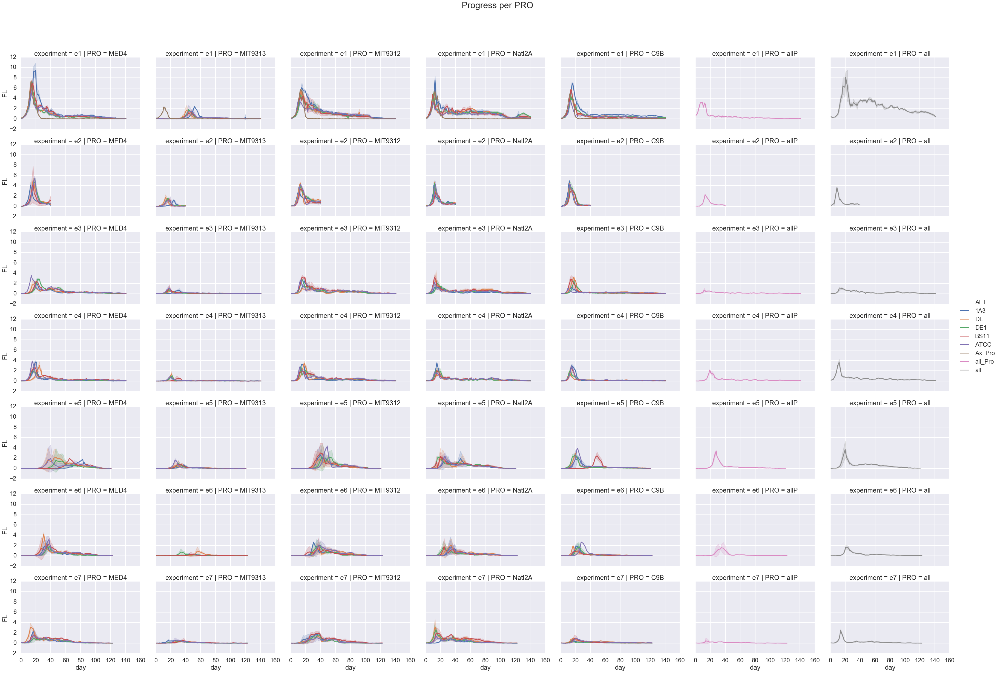

In [4]:
sns.relplot(data=df, x='day', y='FL', kind='line', ci='sd',
            col='PRO', hue='ALT', row='experiment', 
            aspect=1.4
           )
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO", fontsize=32)


Text(0.5,0.98,'Progress per ALT')

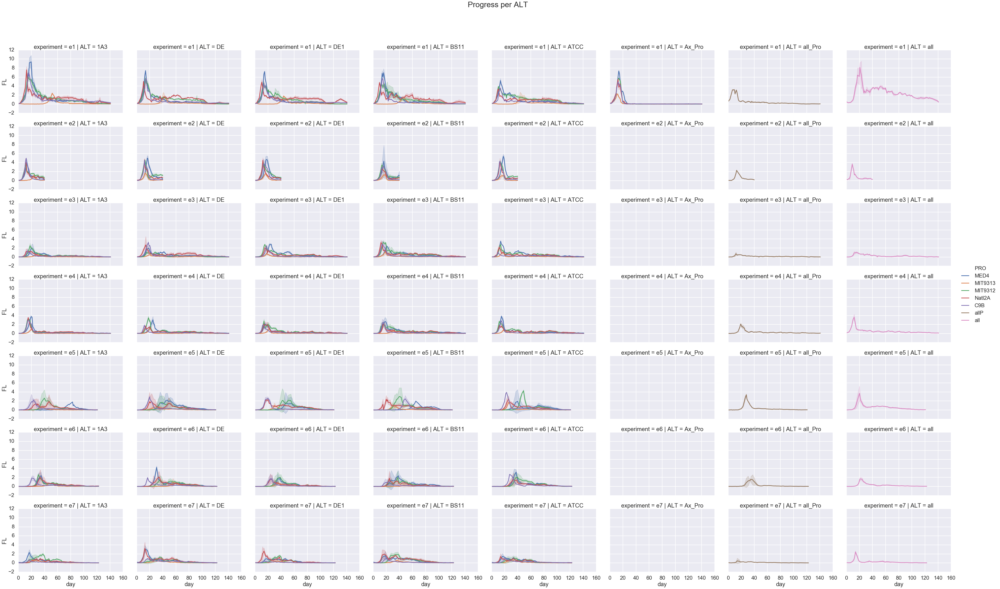

In [7]:
sns.relplot(data=df, x='day', y='FL', kind='line', ci='sd',
            hue='PRO', col='ALT', row='experiment',
           aspect=1.4)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per ALT", fontsize=32)


Text(0.5,0.98,'Progress per Experiment')

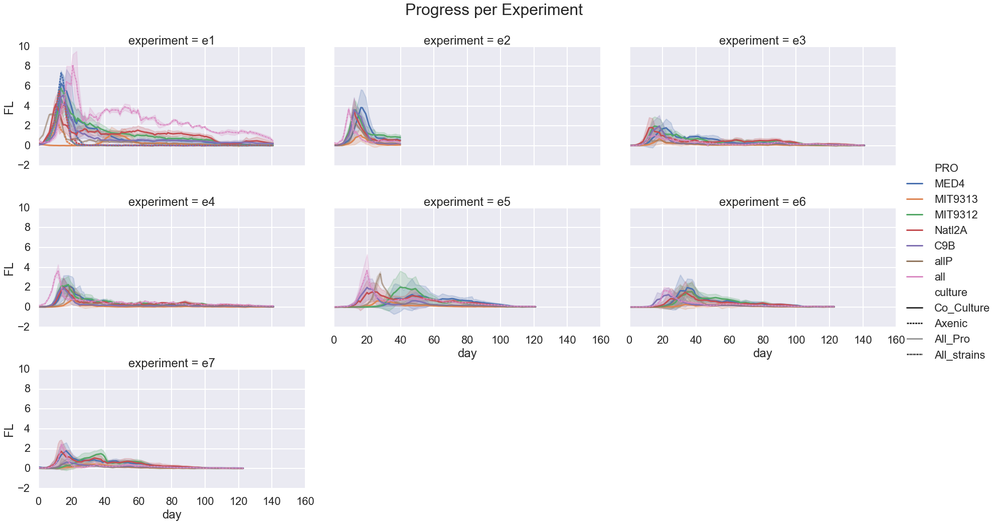

In [8]:
sns.relplot(data=df, x='day', y='FL', kind='line', ci='sd',
            hue='PRO', aspect=1.7, style='culture',  #col='culture', #col='ALT', 
            col='experiment', col_wrap=3)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per Experiment", fontsize=32)


Text(0.5,0.98,'Progress per Culture')

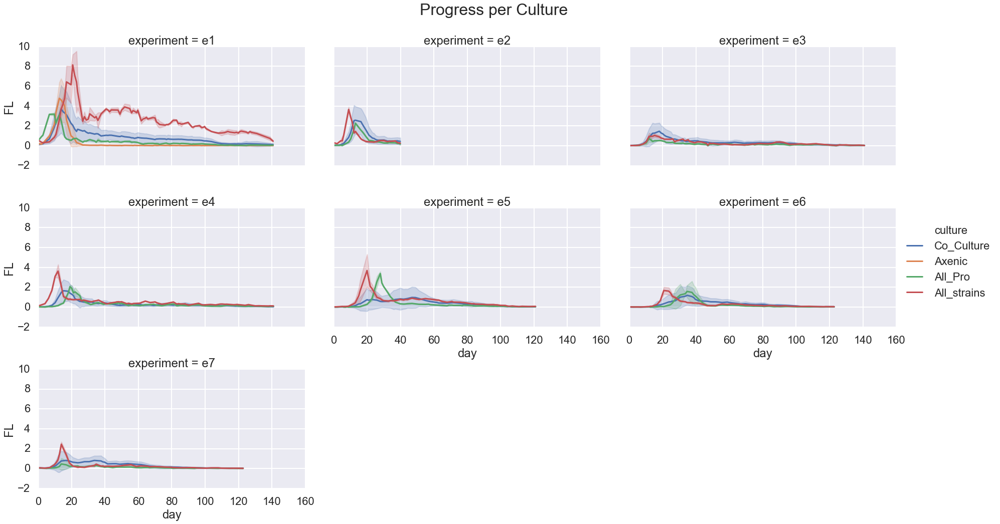

In [9]:
sns.relplot(data=df, x='day', y='FL', kind='line', ci='sd',
             aspect=1.7, hue='culture',  #col='culture', #col='ALT', 
            col='experiment', col_wrap=3)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per Culture", fontsize=32)


In [10]:
meta_dfs[0].PRO.unique()

array(['MED4', 'MIT9313', 'MIT9312', 'Natl2A', 'C9B', 'allP', 'all'],
      dtype=object)

In [12]:
df.head()

,day,experiment,sample,FL,PRO,ALT,culture,day_b
0,0.000000,e1,1A,0.133,MED4,1A3,Co_Culture,0
1,0.715972,e1,1A,0.159,MED4,1A3,Co_Culture,1
2,1.925694,e1,1A,0.155,MED4,1A3,Co_Culture,2
3,2.831250,e1,1A,0.180,MED4,1A3,Co_Culture,3
4,6.674306,e1,1A,0.632,MED4,1A3,Co_Culture,7


In [13]:
[d.shape for d in dfs]

[(88, 93), (29, 80), (79, 76), (78, 79), (65, 71), (54, 72), (53, 78)]

Text(0.5,0.98,'Progress per Experiment (Co-Cultures only)')

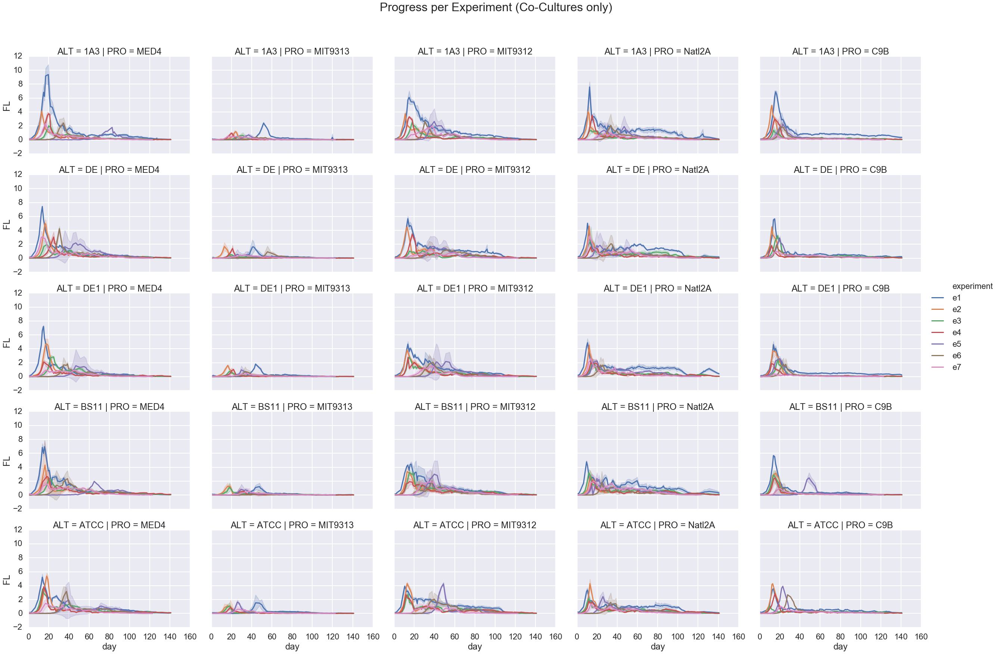

In [14]:
sns.relplot(data=df.loc[df.culture.str.contains("Co_Culture")], x='day', y='FL', kind='line', ci='sd',
            col='PRO', row='ALT', hue='experiment', 
           aspect=1.4)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per Experiment (Co-Cultures only)", fontsize=32)


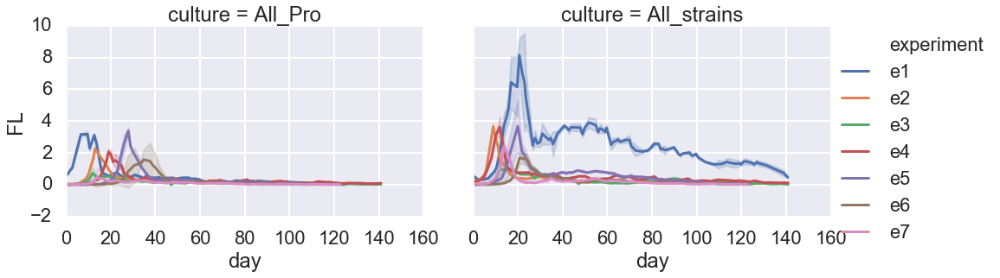

In [15]:
sns.relplot(data=df.loc[~df.culture.str.contains("Co_Culture|Axenic")], x='day', y='FL', kind='line', ci='sd',
            col='culture', #row='culture', 
            hue='experiment', 
           aspect=1.4)
#plt.subplots_adjust(top=0.8)
#plt.suptitle("Progress per Experiment")


# upto 40 days


Text(0.5,0.98,'Progress per PRO, 40 days')

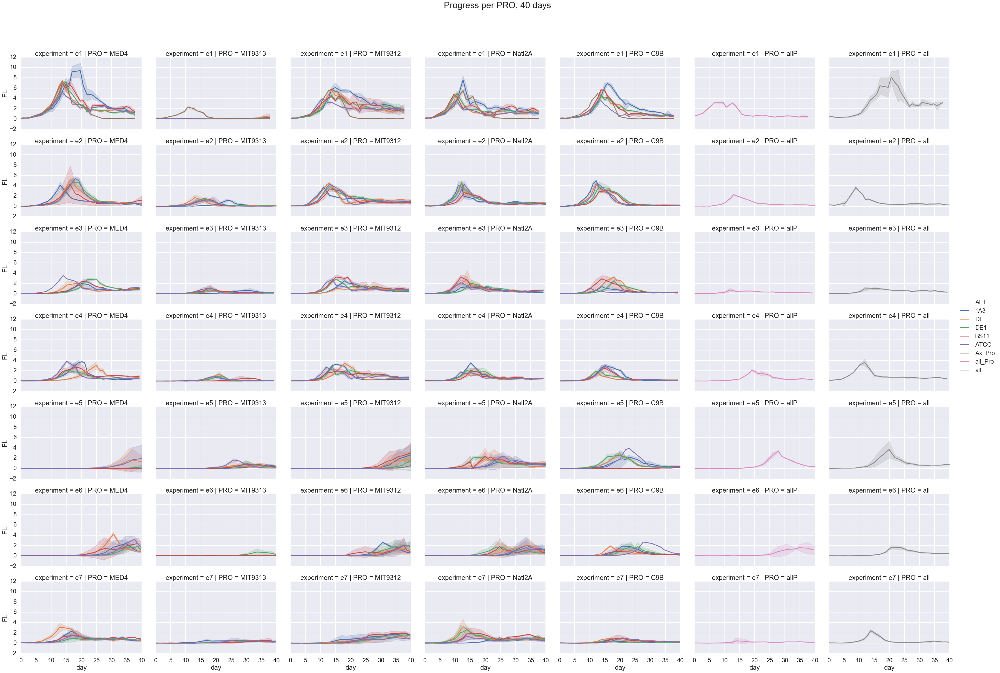

In [18]:
sns.relplot(data=df.loc[df.day<= 40], x='day', y='FL', kind='line', ci='sd',
            col='PRO', hue='ALT', row='experiment', 
            aspect=1.4
           )
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO, 40 days", fontsize=32)


Text(0.5,0.98,'Progress per ALT, 40 days')

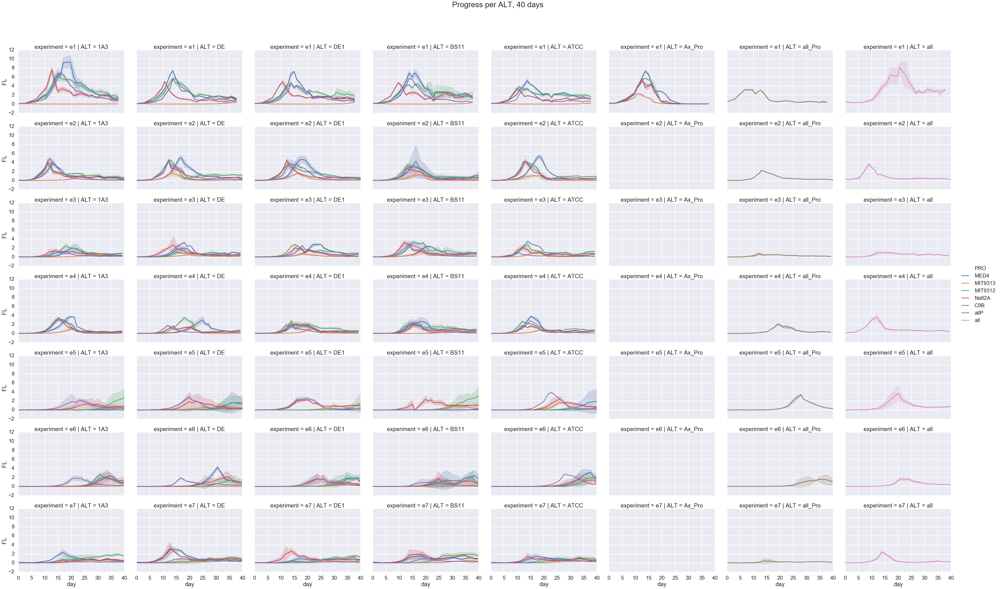

In [19]:
sns.relplot(data=df.loc[df.day<= 40], x='day', y='FL', kind='line', ci='sd',
            hue='PRO', col='ALT', row='experiment',
           aspect=1.4)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per ALT, 40 days", fontsize=32)


Text(0.5,0.98,'Progress per Culture, 40 days')

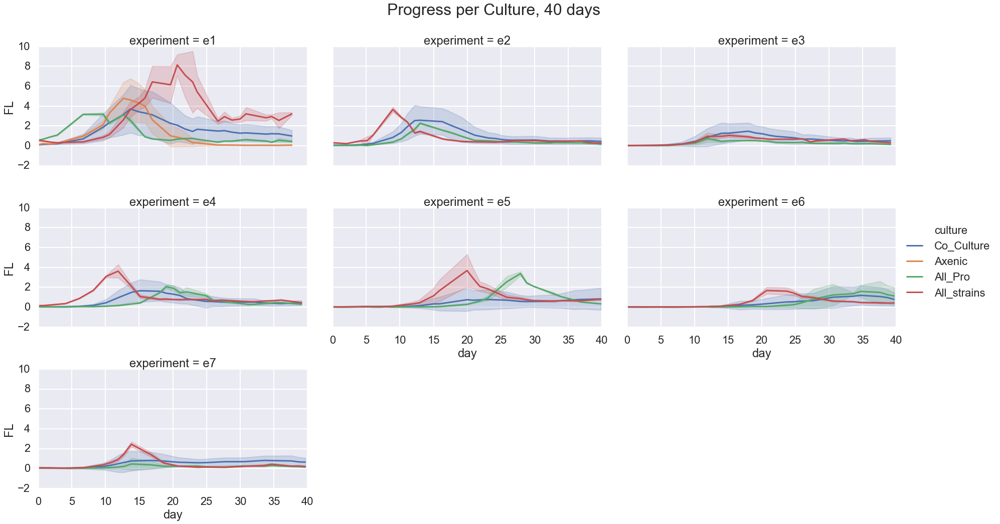

In [21]:
sns.relplot(data=df.loc[df.day < 40], x='day', y='FL', kind='line', ci='sd',
             aspect=1.7, hue='culture',  #col='culture', #col='ALT', 
            col='experiment', col_wrap=3)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per Culture, 40 days", fontsize=32)


# all experiments concatenated

In [24]:
dfcat = df.loc[(df.experiment == 'e1') | 
               (df.experiment == 'e3') |
               (df.experiment == 'e4') |
               (df.experiment == 'e5') |
               (df.experiment == 'e6') 
              ]

In [25]:
def update_day_column(d, prev_exp, cur_exp):
    emax = d.loc[d.experiment == prev_exp].day.max()
    d.loc[d.experiment == cur_exp, 'day'] = d.loc[d.experiment == cur_exp, 'day'] + emax + 1
    return d
dfcat = update_day_column(dfcat, 'e1', 'e3')
dfcat = update_day_column(dfcat, 'e3', 'e4')
dfcat = update_day_column(dfcat, 'e4', 'e5')
dfcat = update_day_column(dfcat, 'e5', 'e6')


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [13]:
dfcat['rateFL'] = dfcat.groupby(['sample']).FL.transform(pd.Series.diff)
dfcat['logFL'] =np.log(dfcat['FL'])
dfcat['cumsumFL'] = dfcat.groupby(['sample']).FL.transform(pd.Series.cumsum)
dfcat['cumsumlogFL'] = dfcat.groupby(['sample']).logFL.transform(pd.Series.cumsum)

dfcat['zscoreFL'] = dfcat.groupby(['sample']).FL.transform(stats.zscore)

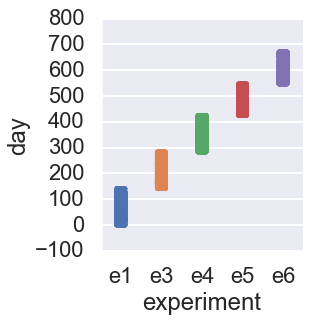

In [14]:
sns.catplot(data=dfcat, x='experiment', y='day')

Text(0.5,0.98,'Progress per PRO, all experiments concatenated')

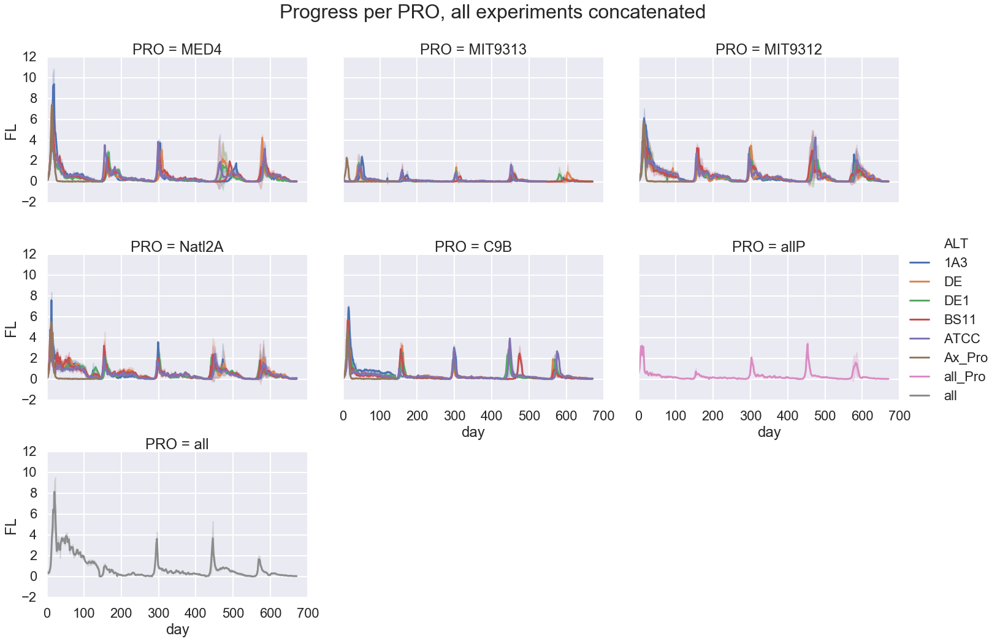

In [23]:
sns.relplot(data=dfcat, x='day', y='FL', kind='line', ci='sd',
            col='PRO', col_wrap=3, hue='ALT', 
            aspect=1.4
           )
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO, all experiments concatenated", fontsize=32)


Text(0.5,0.98,'Progress per ALT, all experiments concatenated')

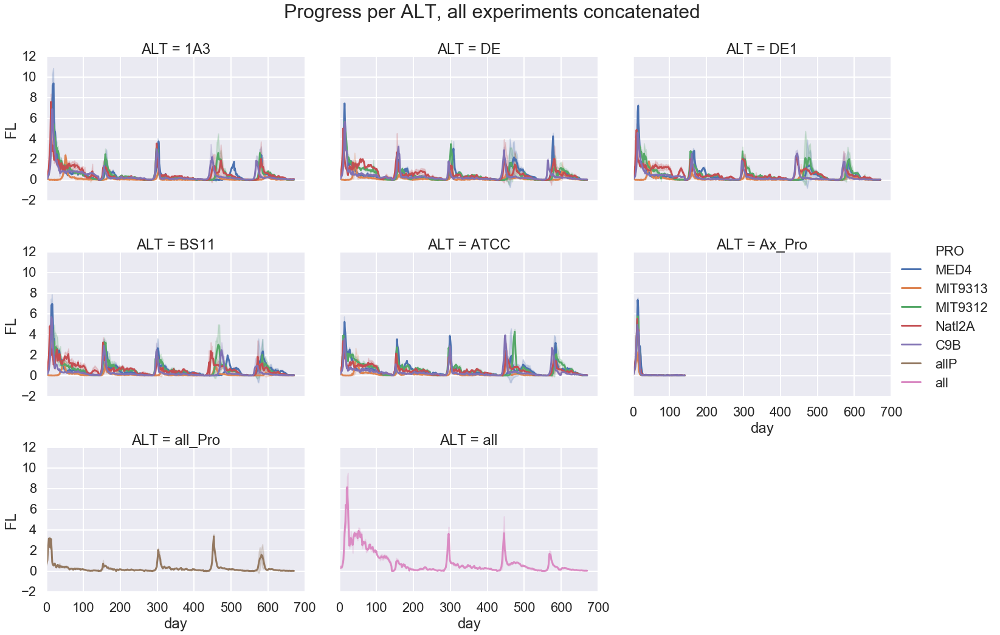

In [51]:
sns.relplot(data=dfcat, x='day', y='FL', kind='line', ci='sd',
            col='ALT', col_wrap=3, hue='PRO', 
            aspect=1.4
           )
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per ALT, all experiments concatenated", fontsize=32)


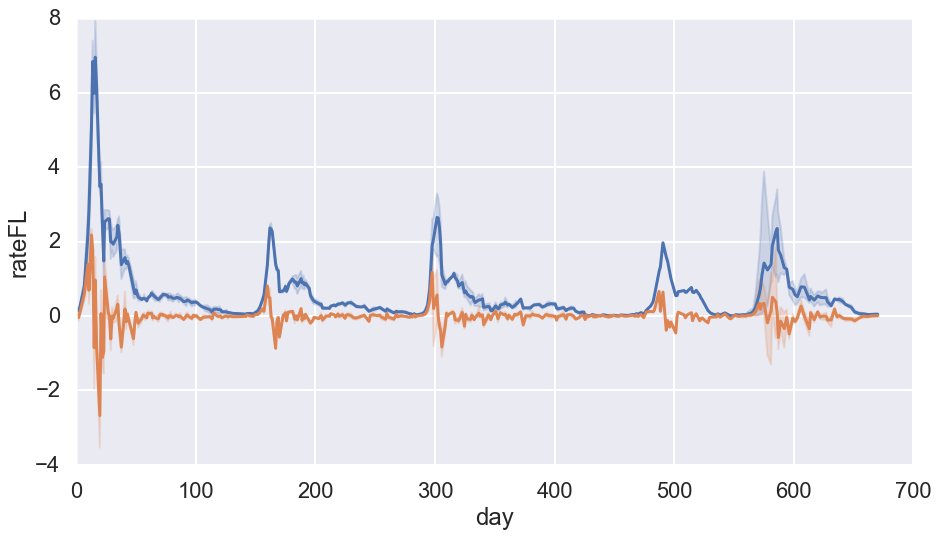

In [28]:
sns.lineplot(x='day', y='FL', data=dfcat.loc[(dfcat.ALT=='BS11') & (dfcat.PRO == 'MED4')])
sns.lineplot(x='day', y='rateFL', data=dfcat.loc[(dfcat.ALT=='BS11') & (dfcat.PRO == 'MED4')])
#sns.lineplot(x='day', y='cumsumFL', data=dfcat.loc[(dfcat.ALT=='BS11') & (dfcat.PRO == 'MED4')])


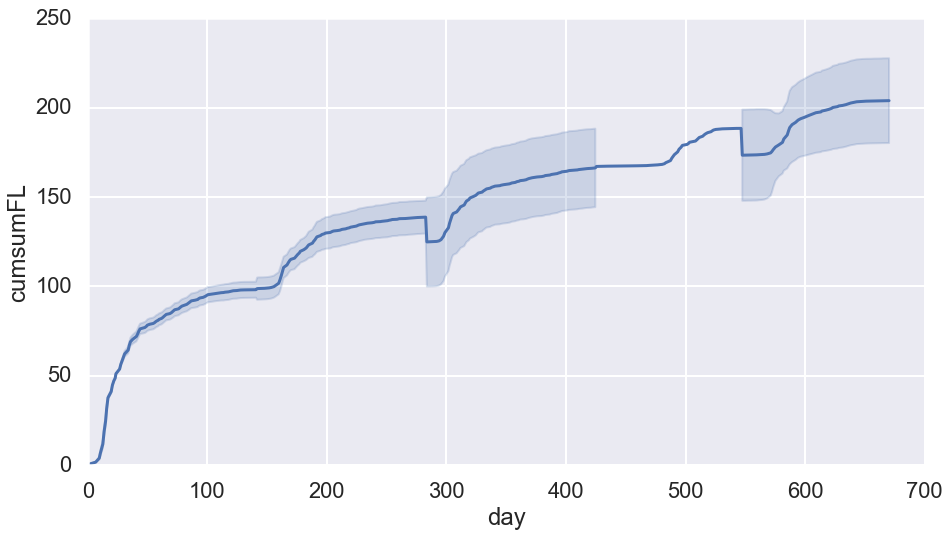

In [34]:
sns.lineplot(x='day', y='cumsumFL', data=dfcat.loc[(dfcat.ALT=='BS11') & (dfcat.PRO == 'MED4')], 
            #estimator=None, lw=1, 
            ci='sd', 
             #units='sample'
            )


Text(0.5,1,'Progress per Culture, all experiments concatenated')

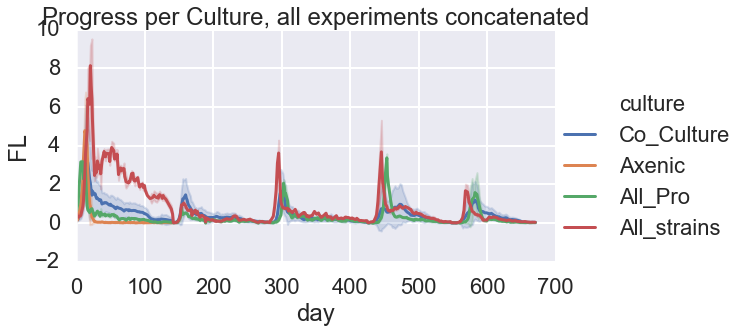

In [56]:
sns.relplot(data=dfcat, x='day', y='FL', kind='line', ci='sd',
             aspect=1.7, hue='culture',  #col='culture', #col='ALT', 
            #col='experiment', col_wrap=3
           )
#plt.subplots_adjust(top=0.9)
plt.title("Progress per Culture, all experiments concatenated")


In [27]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
X = dfcat.pivot(index='sample', columns='day', values='cumsumlogFL')
X.fillna(method='pad', inplace=True)
scaledX = StandardScaler().fit_transform(X)
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(scaledX)
print('Variance percent explained\n', pca.explained_variance_ratio_)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['PCA1', 'PCA2'])
principalDf.set_index(X.index, inplace=True)
meta = meta_dfs[0]
dfpca = pd.merge(left=principalDf, left_index=True, right=meta, right_on='sample')

Variance percent explained
 [0.85557378 0.06019326]


Text(0.5,1,'Progress per PRO, all experiments concatenated (cum sum of log)')

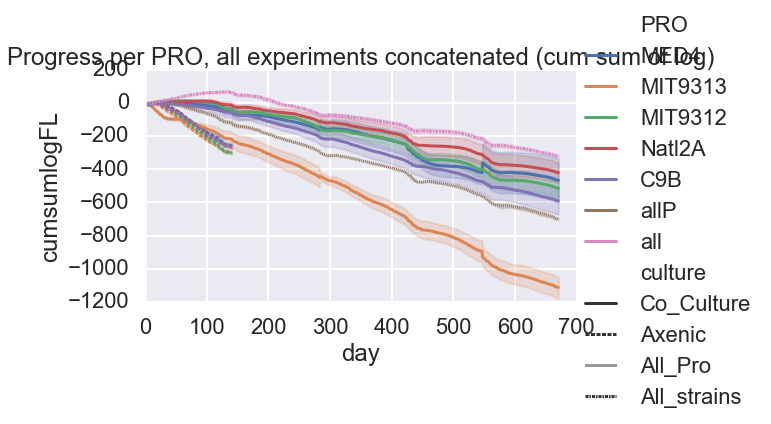

In [47]:
sns.relplot(data=dfcat, x='day', y='cumsumlogFL', kind='line', ci='sd',
             aspect=1.7, hue='PRO',  style='culture', #col='ALT', 
            #col='experiment', col_wrap=3
           )
#plt.subplots_adjust(top=0.9)
plt.title("Progress per PRO, all experiments concatenated (cum sum of log)")


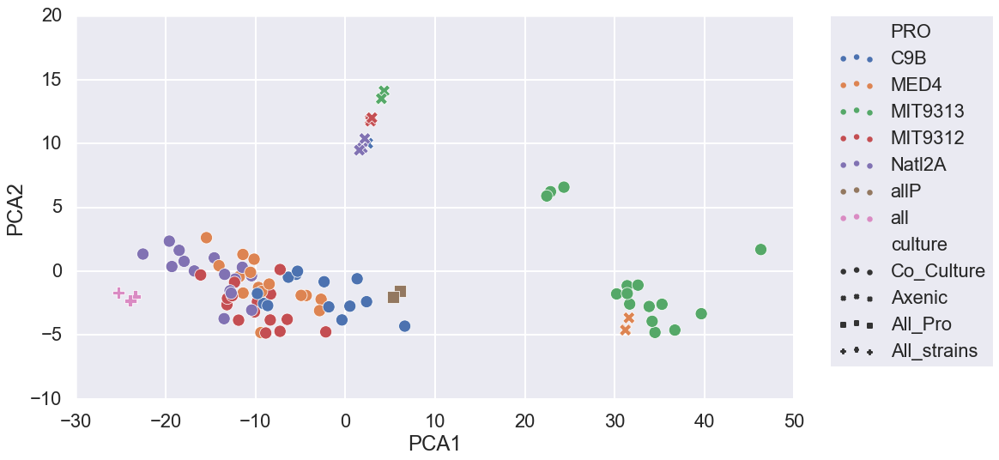

In [49]:
sns.scatterplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=200)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

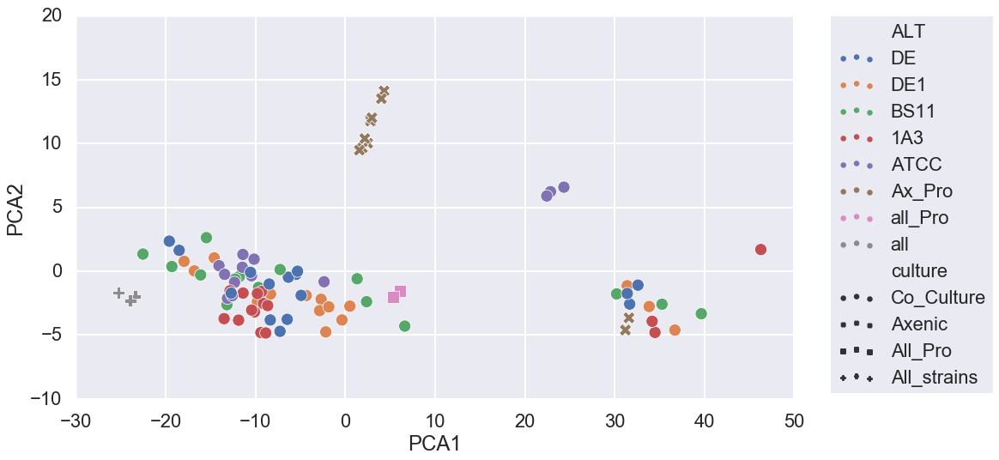

In [50]:
sns.scatterplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', style='culture',s=200)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [52]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
X = dfcat.loc[(dfcat.culture == 'Co_Culture') & (dfcat.PRO != 'MIT9313')].pivot(index='sample', 
                                                                                columns='day', values='cumsumlogFL')
X.fillna(method='pad', inplace=True)
scaledX = StandardScaler().fit_transform(X)
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(scaledX)
print('Variance percent explained\n', pca.explained_variance_ratio_)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['PCA1', 'PCA2'])
principalDf.set_index(X.index, inplace=True)
meta = meta_dfs[0]
dfpca = pd.merge(left=principalDf, left_index=True, right=meta, right_on='sample')

Variance percent explained
 [0.68417054 0.12171265]


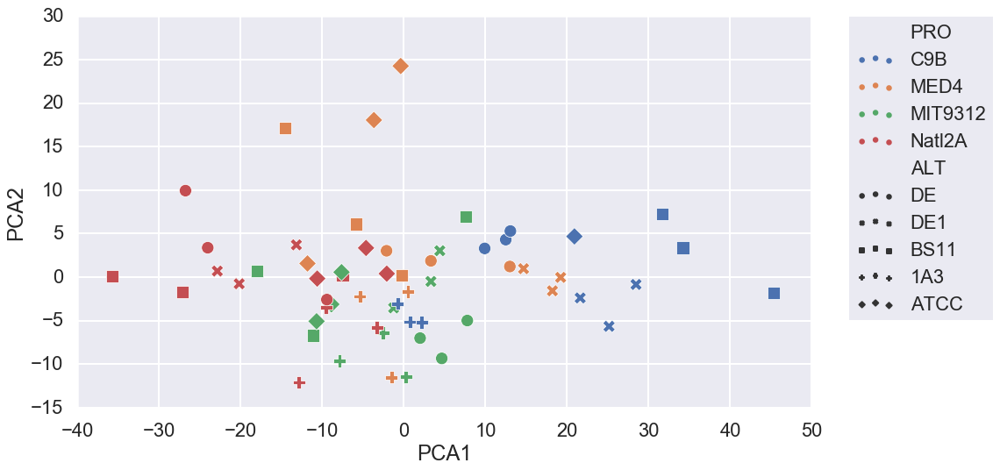

In [53]:
sns.scatterplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='ALT',s=200)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [56]:
dfpca.loc[dfpca.PCA2 > 10]

,PCA1,PCA2,sample,PRO,ALT,culture
47,-14.572048,17.110817,16C,MED4,BS11,Co_Culture
60,-0.393955,24.267544,21A,MED4,ATCC,Co_Culture
61,-3.676242,18.053021,21B,MED4,ATCC,Co_Culture


In [92]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
#X = dfcat.pivot(index='sample', columns='day', values='cumsumlogFL')
X = dfcat.loc[(dfcat.culture == 'Co_Culture') #& (dfcat.PRO != 'MIT9313')
             ].pivot(index='sample', columns='day', values='cumsumlogFL')
X.fillna(method='pad', inplace=True)

scaledX = StandardScaler().fit_transform(X)
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(scaledX)
print('Variance percent explained\n', pca.explained_variance_ratio_)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['PCA1', 'PCA2', 'PCA3'])
principalDf.set_index(X.index, inplace=True)
meta = meta_dfs[0]
dfpca = pd.merge(left=principalDf, left_index=True, right=meta, right_on='sample')

Variance percent explained
 [0.90890766 0.04104824 0.01859473]


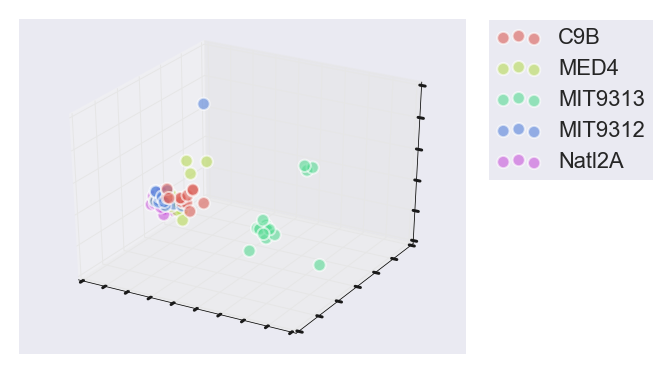

In [93]:
from matplotlib.colors import ListedColormap
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
numcolors = dfpca.PRO.nunique() 
numshapes = dfpca.culture.nunique() 
pallete = sns.color_palette('hls', n_colors=numcolors).as_hex() 
#cmap = ListedColormap(sns.color_palette(n_colors=numcolors))
for i, pro in enumerate(dfpca.PRO.unique()):
    #for culture in dfpca.culture.unique():
        d = dfpca.loc[(dfpca.PRO == pro)]
        ax.scatter(d.PCA1, d.PCA2, d.PCA3, s=150, alpha=0.6, edgecolors='w', c=pallete[i], label=pro)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_zticklabels([])

plt.show()

In [94]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
#X = dfcat.pivot(index='sample', columns='day', values='cumsumlogFL')
X = dfcat.loc[(dfcat.culture == 'Co_Culture') & (dfcat.PRO != 'MIT9313')
             ].pivot(index='sample', columns='day', values='cumsumlogFL')
X.fillna(method='pad', inplace=True)

scaledX = StandardScaler().fit_transform(X)
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(scaledX)
print('Variance percent explained\n', pca.explained_variance_ratio_)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['PCA1', 'PCA2', 'PCA3'])
principalDf.set_index(X.index, inplace=True)
meta = meta_dfs[0]
dfpca = pd.merge(left=principalDf, left_index=True, right=meta, right_on='sample')

Variance percent explained
 [0.68417054 0.12171265 0.08543636]


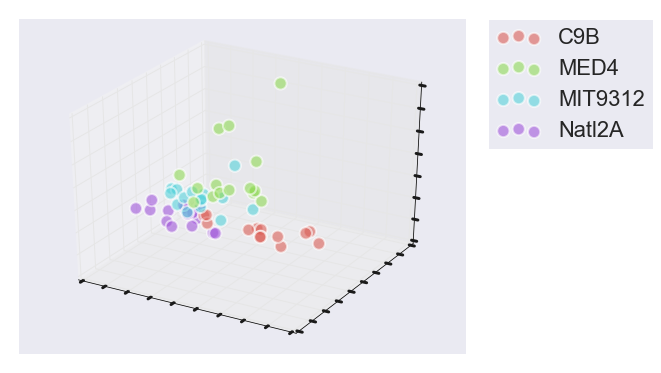

In [95]:
from matplotlib.colors import ListedColormap
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
numcolors = dfpca.PRO.nunique() 
numshapes = dfpca.culture.nunique() 
pallete = sns.color_palette('hls', n_colors=numcolors).as_hex() 
#cmap = ListedColormap(sns.color_palette(n_colors=numcolors))
for i, pro in enumerate(dfpca.PRO.unique()):
    #for culture in dfpca.culture.unique():
        d = dfpca.loc[(dfpca.PRO == pro)]
        ax.scatter(d.PCA1, d.PCA2, d.PCA3, s=150, alpha=0.6, edgecolors='w', c=pallete[i], label=pro)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_zticklabels([])

plt.show()

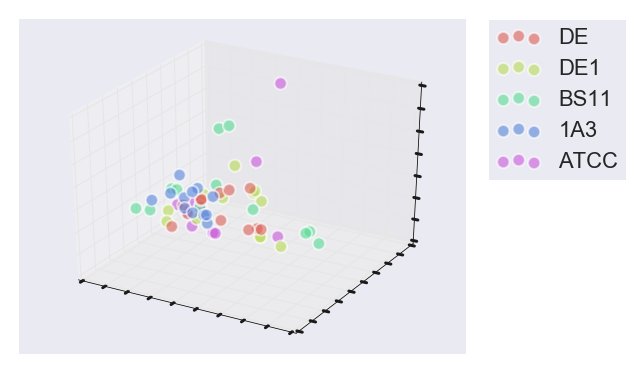

In [89]:
from matplotlib.colors import ListedColormap
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
numcolors = dfpca.ALT.nunique() 
numshapes = dfpca.culture.nunique() 
pallete = sns.color_palette('hls', n_colors=numcolors).as_hex() 
#cmap = ListedColormap(sns.color_palette(n_colors=numcolors))
for i, alt in enumerate(dfpca.ALT.unique()):
    #for culture in dfpca.culture.unique():
        d = dfpca.loc[(dfpca.ALT == alt)]
        ax.scatter(d.PCA1, d.PCA2, d.PCA3, s=150, alpha=0.6, edgecolors='w', c=pallete[i], label=alt)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_zticklabels([])

plt.show()

# Z score normalized

In [58]:
from scipy import stats


In [87]:
dfz = df.copy()

In [88]:
from scipy import stats
def norm_zscore(d, experiment, sample):
    d.loc[(d.experiment == experiment) & 
          (d['sample'] == sample), 'FL'] = stats.zscore(
              d.loc[(d.experiment == experiment) &
                    (d['sample'] == sample), 'FL'])
    return d
for e in dfz.experiment.unique():
    for s in dfz['sample'].unique():
        dfz = norm_zscore(dfz, e, s)


C:\Users\wosnat\Anaconda3\lib\site-packages\scipy\stats\stats.py:2241: RuntimeWarning: Mean of empty slice.
  mns = a.mean(axis=axis)
C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


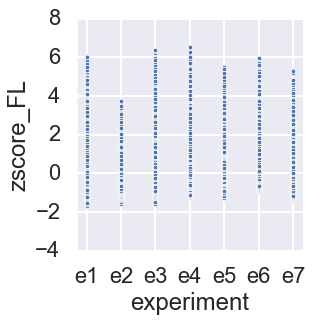

In [10]:
sns.relplot(data=df, x='experiment', y='zscore_FL')

Text(0.5,0.98,'Progress per PRO, zscore')

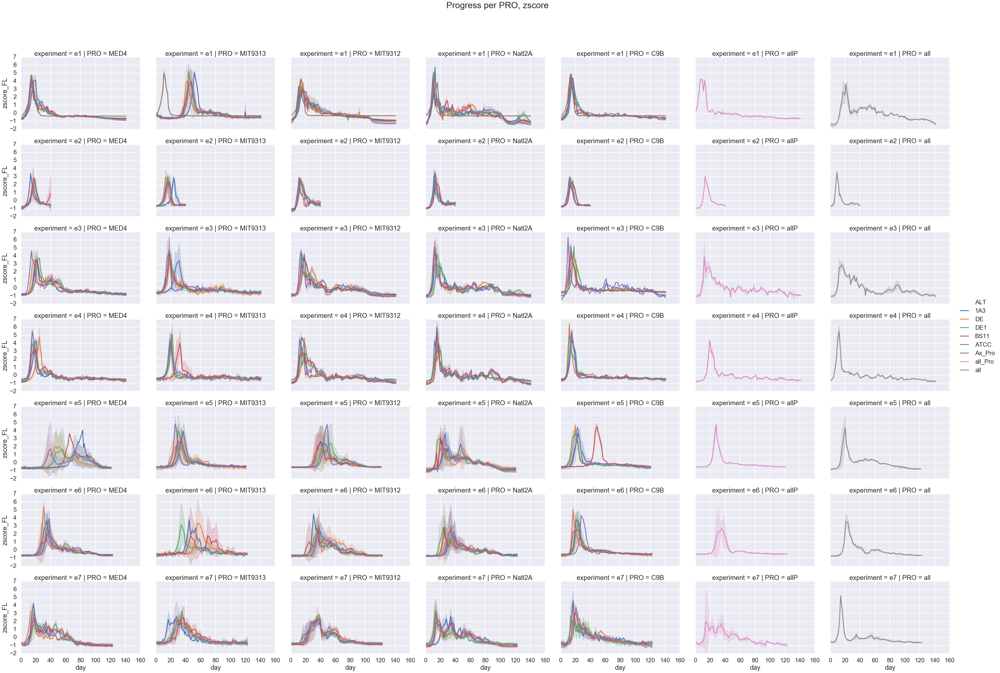

In [11]:
sns.relplot(data=df, x='day', y='zscore_FL', kind='line', ci='sd',
            col='PRO', hue='ALT', row='experiment', 
            aspect=1.4
           )
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per PRO, zscore", fontsize=32)


Text(0.5,0.98,'Progress per ALT, zscore')

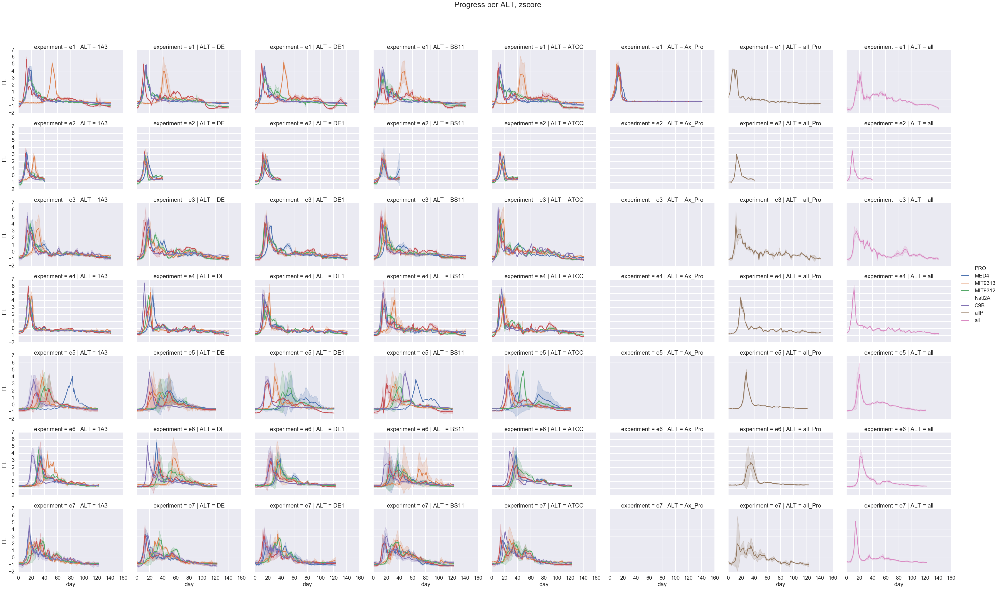

In [91]:
sns.relplot(data=dfz, x='day', y='FL', kind='line', ci='sd',
            hue='PRO', col='ALT', row='experiment',
           aspect=1.4)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per ALT, zscore", fontsize=32)


Text(0.5,0.98,'Progress per Culture, zscore')

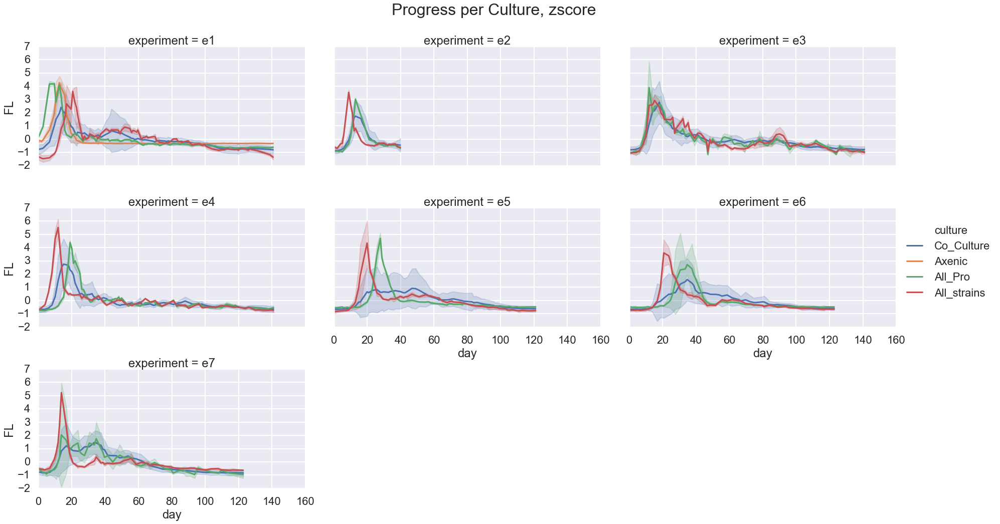

In [92]:
sns.relplot(data=dfz, x='day', y='FL', kind='line', ci='sd',
             aspect=1.7, hue='culture',  #col='culture', #col='ALT', 
            col='experiment', col_wrap=3)
plt.subplots_adjust(top=0.9)
plt.suptitle("Progress per Culture, zscore", fontsize=32)


# Rates

In [9]:
df.head()

,day,experiment,sample,FL,PRO,ALT,culture,day_b,rate
0,0.000000,e1,1A,0.133,MED4,1A3,Co_Culture,0,NaN
1,0.715972,e1,1A,0.159,MED4,1A3,Co_Culture,1,0.026
2,1.925694,e1,1A,0.155,MED4,1A3,Co_Culture,2,-0.004
3,2.831250,e1,1A,0.180,MED4,1A3,Co_Culture,3,0.025
4,6.674306,e1,1A,0.632,MED4,1A3,Co_Culture,7,0.452


In [19]:
df['rate'] = df.groupby(['experiment', 'sample']).FL.transform(pd.Series.diff)


In [20]:
df['logFL'] =np.log(df['FL'])

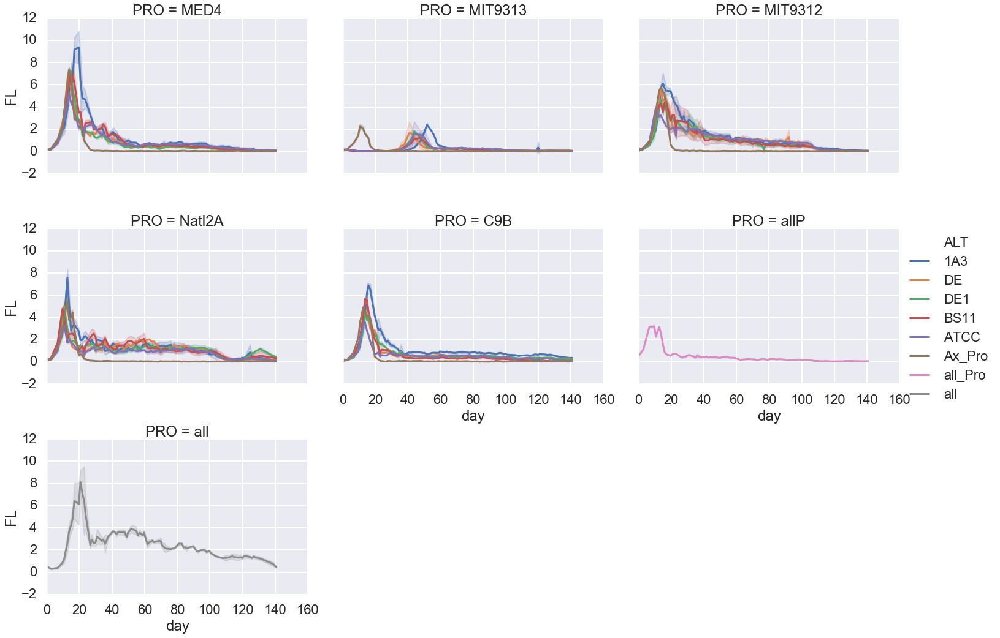

In [26]:
sns.relplot(data=df.loc[df.experiment == 'e1'], x='day', y='FL', kind='line', ci='sd',
            col='PRO', hue='ALT', col_wrap=3, 
            aspect=1.4
           )


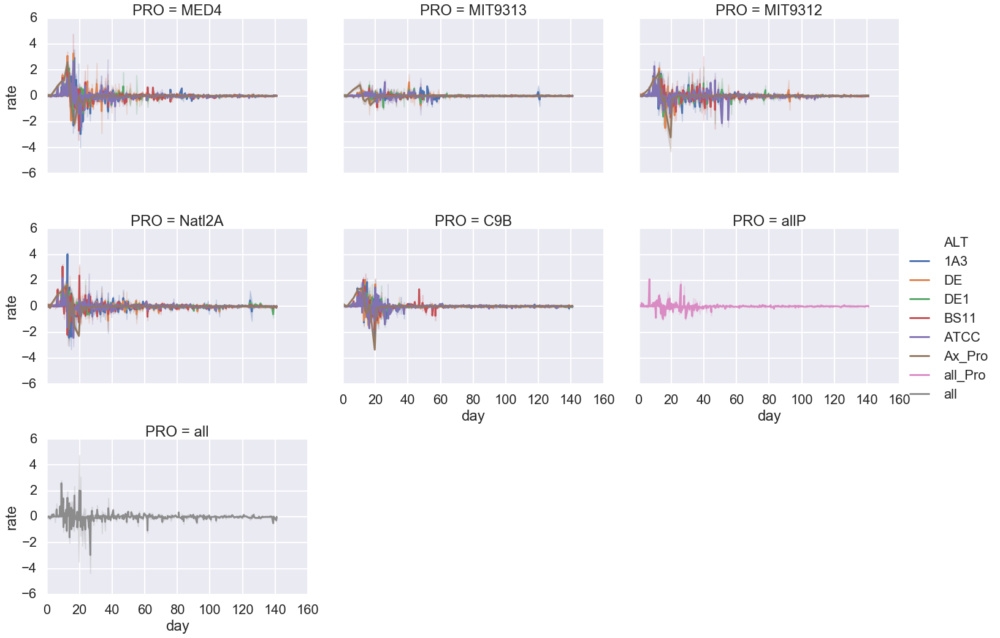

In [32]:
sns.relplot(data=df, x='day', y='rate', kind='line', ci='sd',
            col='PRO', hue='ALT', col_wrap=3, 
            aspect=1.4
           )


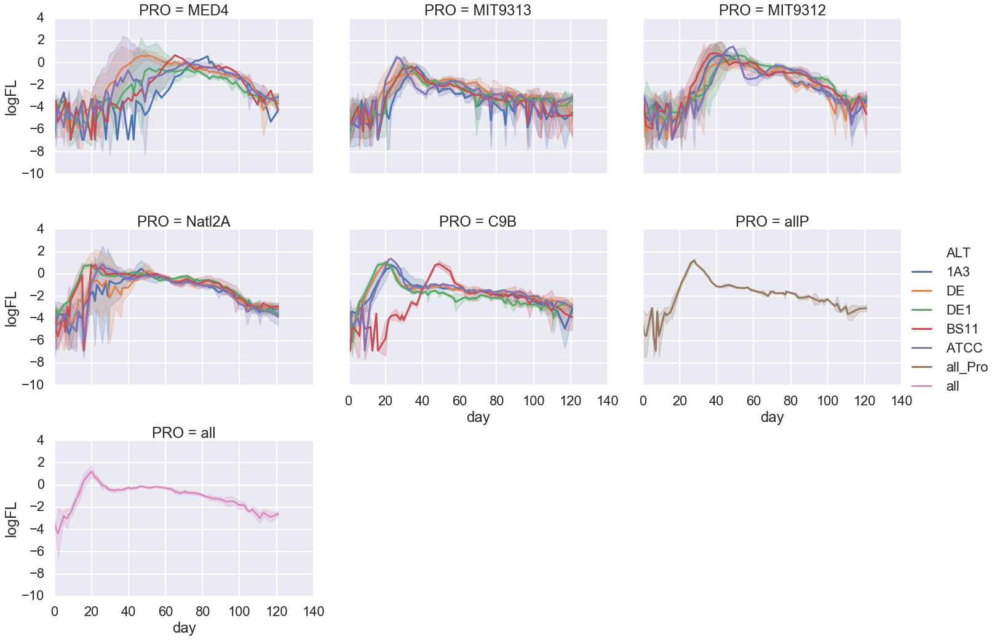

In [22]:
sns.relplot(data=df.loc[df.experiment == 'e5'], x='day', y='logFL', kind='line', ci='sd',
            col='PRO', hue='ALT', col_wrap=3, 
            aspect=1.4
           )


# Features from Curves

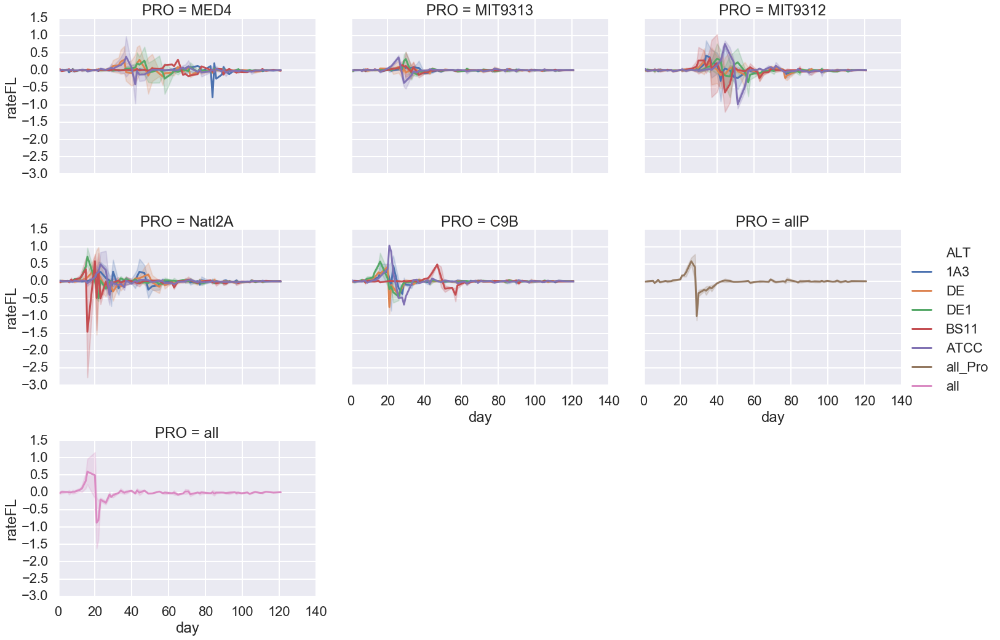

In [15]:
sns.relplot(data=df.loc[df.experiment == 'e5'], x='day', y='rateFL', kind='line', ci='sd',
            col='PRO', hue='ALT', col_wrap=3, 
            aspect=1.4
           )

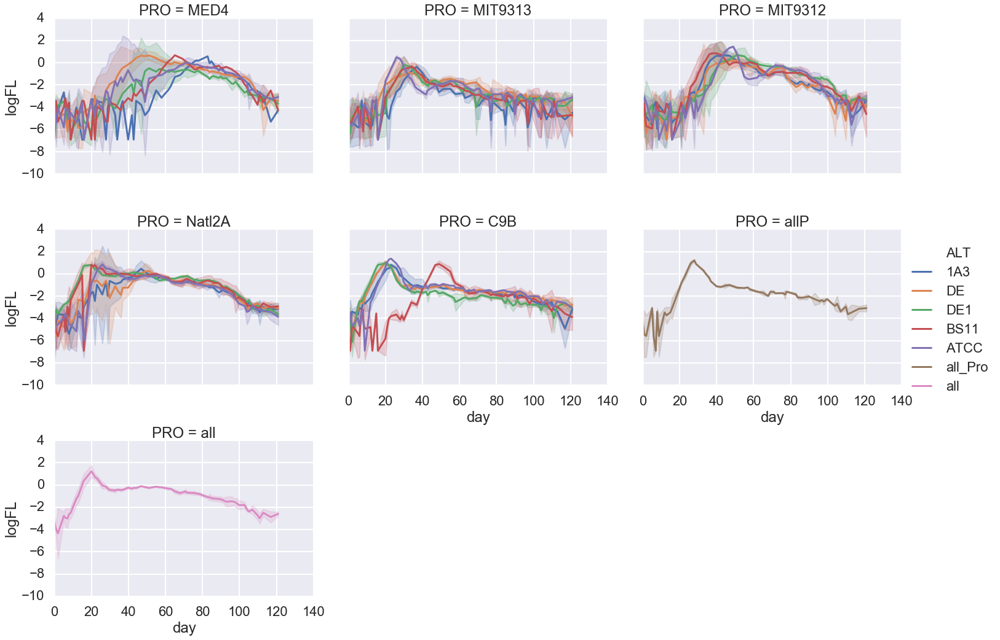

In [16]:
sns.relplot(data=df.loc[df.experiment == 'e5'], x='day', y='logFL', kind='line', ci='sd',
            col='PRO', hue='ALT', col_wrap=3, 
            aspect=1.4
           )

Compute the following features based on a growth curve:

1. lag phase: time until the first growth
   - lag phase end time
   - lag phase max value
   (startThreashold = Application.WorksheetFunction.Max(yvalues) + 4 * (Application.WorksheetFunction.StDev(yvalues)))
2. growth phase: growth till max value
   - growth max value
   - growth diff (growth max value - lag phase max value)
   - growth end time
   - growth time (growth end time - lag phase end time
   - growth rate (growth diff / growth time)
   
3. stationary phase
   -


4. decline phase
   - decline time - total time to get to 0.5
   - half yield - time to get to 1/2 growth max value
       (halfDeclineTime = (halfYield - beforeHalf + (declinePointsSlope * beforeHalfTime)) / declinePointsSlope)
       (halfLife = halfDeclineTime - maxTime)
   - tenth yield - time to get to 1/10 growth max value
   - decline rate
   - number of spikes
   

5. global params
  - AUC - area under the curve

In [8]:
def find_in_df(df, x_col, y_col, value):
    """ return time, value for the value closest to value in the value_col column
    """
    idx = df[y_col].sub(value).abs().idxmin()
    #print(idx)
    #print(df.loc[idx])
    return df.loc[idx][[x_col, y_col]].tolist()

def find_midpoint(df, max_val, min_val, x_col, y_col, relative_coef):
    midpoint = (max_val - min_val)*relative_coef + min_val
#    print(df[x_col])
    first_x = df[x_col].values[0]
    x, y = find_in_df(df, x_col, y_col, midpoint)
#    return (x, y)
    return (x - first_x, y)
    

In [9]:
from sklearn.linear_model import LinearRegression
def fit_regression(df, x_col, y_col):
    """ fit linear regression. 
    return: model, intercept, coef, score
    """
    X = df[x_col].values.reshape((df.shape[0], 1))
    y = df[y_col]
    reg = LinearRegression(normalize=True).fit(X, y)
    return (reg, reg.intercept_, reg.coef_[0], reg.score(X, y))


In [267]:
from sklearn import metrics
def analyze_half_curve(df, label, max_val, min_val, x_col, y_col, y_logcol, rate_col, rate_logcol):
    half_day,     half_val    = find_midpoint(df, max_val, min_val, x_col, y_col, 0.5)
    loghalf_day,  loghalf_val = find_midpoint(df, np.log(max_val), np.log(min_val), x_col, y_logcol, 0.5)
    tenth_day,    tenth_val   = find_midpoint(df, max_val, min_val, x_col, y_col, 0.1)
    logtenth_day, logtenth_val = find_midpoint(df, np.log(max_val), np.log(min_val), x_col, y_logcol, 0.1)
    reg, intercept, coef, r2_score = fit_regression(df, x_col=x_col, y_col=y_logcol)
    try:
        auc = metrics.auc(df[x_col], df[y_col])
    except ValueError:
        auc = 0
    try:
        logauc = metrics.auc(df[x_col], df[y_logcol])
    except ValueError:
        logauc = 0
    diffval = df[y_col].max() - df[y_col].min()
    difflogval = df[y_logcol].max() - df[y_logcol].min()
    
    res = {
        f'{label}_half_day':     half_day,
        f'{label}_half_val':     half_val,
        f'{label}_log_half_day':  loghalf_day,
        f'{label}_log_half_val':  loghalf_val,
        f'{label}_tenth_day':    tenth_day,
        f'{label}_tenth_val':    tenth_val,
        f'{label}_log_tenth_day': logtenth_day,
        f'{label}_log_tenth_val': logtenth_val,
        f'{label}_log_intercept': intercept,
        f'{label}_log_coefficient': coef,
        f'{label}_log_score_r2': r2_score,
        f'{label}_auc': auc,
        f'{label}_logauc': logauc,
        f'{label}_diff': diffval,
        f'{label}_diff_log': difflogval,
        
        f'{label}_mean': df[y_col].mean(),
        f'{label}_std':  df[y_col].std(),
        f'{label}_min':  df[y_col].min(),
        f'{label}_max':  df[y_col].max(),
        
        f'{label}_mean_log': df[y_logcol].mean(),
        f'{label}_std_log':  df[y_logcol].std(),
        f'{label}_min_log':  df[y_logcol].min(),
        f'{label}_max_log':  df[y_logcol].max(),
        
        f'{label}_mean_rate': df[rate_col].mean(),
        f'{label}_std_rate':  df[rate_col].std(),
        f'{label}_min_rate':  df[rate_col].min(),
        f'{label}_max_rate':  df[rate_col].max(),
        
        f'{label}_mean_log_rate': df[rate_logcol].mean(),
        f'{label}_std_log_rate':  df[rate_logcol].std(),
        f'{label}_min_log_rate':  df[rate_logcol].min(),
        f'{label}_max_log_rate':  df[rate_logcol].max(),        
    }
    return res


In [268]:
def analyze_curve(df, x_col='day', y_col='FL', y_logcol='logFL', rate_col='rateFL', rate_logcol='ratelogFL'):
    df = df.reset_index()
    maxval = df[y_col].max()
    minval = df[y_col].min()
    maxlogval = df[y_logcol].max()
    minlogval = df[y_logcol].min()
    maxidx = df[y_col].idxmax()
    maxday = df.loc[maxidx][x_col]
    res = {
        'max' : maxval,
        'max_log' : maxlogval,
        'max_day' : maxday,
        'min' : minval,
        'min_log' : minlogval,
        'PRO' : df['PRO'].unique()[0],
        'ALT' : df['ALT'].unique()[0],
        'culture' : df['culture'].unique()[0],        
    }
    res.update(analyze_half_curve(df[:maxidx+1], label='growth', 
                                  max_val=maxval, min_val=minval,
                                  x_col=x_col, y_col=y_col, y_logcol=y_logcol,
                                  rate_col=rate_col, rate_logcol=rate_logcol,
                                 ))
    res.update(analyze_half_curve(df[maxidx:], label='decline', 
                                  max_val=maxval, min_val=minval,
                                  x_col=x_col, y_col=y_col, y_logcol=y_logcol,
                                  rate_col=rate_col, rate_logcol=rate_logcol,
                                 ))
    return pd.Series(res)


In [273]:
def display_features(d, res, x_col='day', y_col='FL', y_logcol='logFL'):
    sns.lineplot(data=d, x=x_col, y=y_col, label='FL')
    sns.lineplot(data=d, x=x_col, y=y_logcol, label='logFL')
    sns.scatterplot(x=[res['max_day']], y=[res['max']], label='max', size=[100], legend=False)
    sns.scatterplot(x=[res['max_day']], y=[res['max_log']], label='maxlog', size=[100], legend=False)

    sns.scatterplot(x=[res['growth_half_day']], y=[res['growth_half_val']],  size=[100], legend=False)
    sns.scatterplot(x=[res['growth_log_half_day']], y=[res['growth_log_half_val']],  size=[100], legend=False)
    sns.scatterplot(x=[res['growth_tenth_day']], y=[res['growth_tenth_val']],  size=[100], legend=False)
    sns.scatterplot(x=[res['growth_log_tenth_day']], y=[res['growth_log_tenth_val']],  size=[100], legend=False)
    up_x = d.loc[d[x_col] <= res['max_day'], x_col]
    up_pred = up_x * res['growth_log_coefficient'] + res['growth_log_intercept']
    sns.lineplot(x=up_x, y=up_pred)

    sns.scatterplot(x=[res['max_day']+res['decline_half_day']], y=[res['decline_half_val']],  size=[100], legend=False)
    sns.scatterplot(x=[res['max_day']+res['decline_log_half_day']], y=[res['decline_log_half_val']],  size=[100], legend=False)
    sns.scatterplot(x=[res['max_day']+res['decline_tenth_day']], y=[res['decline_tenth_val']],  size=[100], legend=False)
    sns.scatterplot(x=[res['max_day']+res['decline_log_tenth_day']], y=[res['decline_log_tenth_val']], size=[100], legend=False)
    dn_x = d.loc[d[x_col] >= res['max_day'], x_col]
    dn_pred = dn_x * res['decline_log_coefficient'] + res['decline_log_intercept']
    sns.lineplot(x=dn_x, y=dn_pred)


In [274]:
d = df.loc[(df.experiment == 'e5') & (df['sample'] == '37C')]
#display_features(d, analyze_curve(d))

In [275]:
analyze_curve(d)

max                              2.919
max_log                        1.07124
max_day                          15.87
min                              0.014
min_log                        -4.2687
PRO                                all
ALT                                all
culture                    All_strains
growth_half_day                  14.99
growth_half_val                  2.024
growth_log_half_day                8.8
growth_log_half_val           -1.94491
growth_tenth_day                   8.8
growth_tenth_val                 0.143
growth_log_tenth_day              0.88
growth_log_tenth_val           -4.2687
growth_log_intercept           -3.8682
growth_log_coefficient        0.283315
growth_log_score_r2           0.909423
growth_auc                     7.62855
growth_logauc                 -26.3016
growth_diff                      2.905
growth_diff_log                5.33994
growth_mean                   0.583333
growth_std                    0.931931
growth_min               

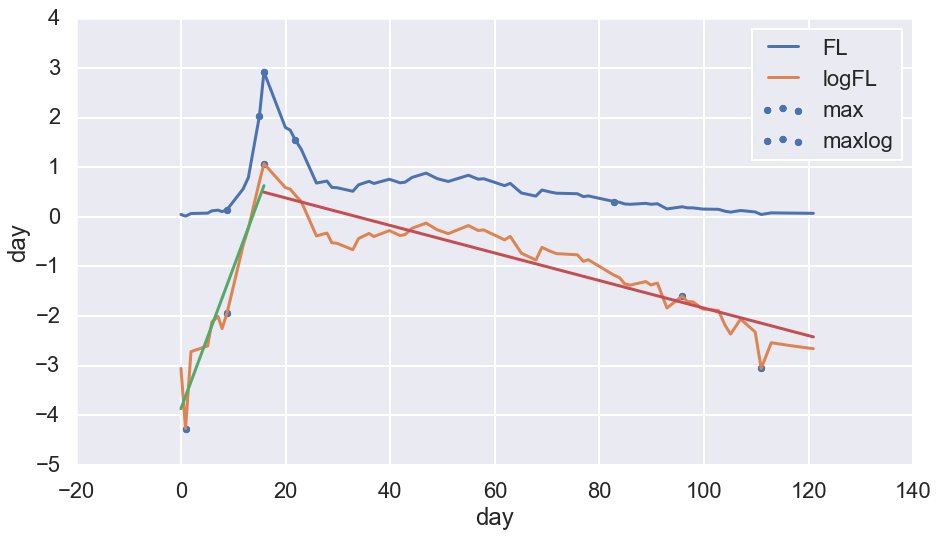

In [276]:
display_features(d, analyze_curve(d))

In [277]:
g = df.groupby(['sample', 'experiment']).apply(analyze_curve).reset_index()


In [278]:
g.head()

,sample,experiment,max,max_log,max_day,min,min_log,PRO,ALT,culture,...,decline_min_log,decline_max_log,decline_mean_rate,decline_std_rate,decline_min_rate,decline_max_rate,decline_mean_log_rate,decline_std_log_rate,decline_min_log_rate,decline_max_log_rate
0,10A,e1,5.621,1.726510,14.960417,0.060,-2.813411,C9B,DE,Co_Culture,...,-1.795767,1.726510,-0.055531,0.288990,-1.764728,0.548631,-0.021946,0.188968,-0.649153,0.877455
1,10A,e2,4.521,1.508733,12.200000,0.014,-4.268698,C9B,DE,Co_Culture,...,-2.095571,1.508733,-0.092445,0.552794,-1.037168,1.804587,-0.096100,0.296459,-0.776075,0.523920
2,10A,e3,3.352,1.209557,18.040000,0.005,-5.298317,C9B,DE,Co_Culture,...,-2.780621,1.209557,-0.032052,0.171651,-0.886408,0.353004,-0.026526,0.170312,-0.540490,0.439023
3,10A,e4,1.775,0.573800,11.880000,0.014,-4.268698,C9B,DE,Co_Culture,...,-3.411248,0.573800,-0.004424,0.082860,-0.424272,0.424157,0.002264,0.259969,-1.094218,0.646627
4,10A,e5,3.083,1.125903,19.970000,0.005,-5.298317,C9B,DE,Co_Culture,...,-3.079114,1.125903,-0.028919,0.151802,-0.843956,0.478293,-0.036477,0.174164,-0.556721,0.407993


In [279]:
meta_cols = ['sample', 'experiment','PRO', 'ALT', 'culture']
feature_cols = g.columns.difference(meta_cols)

In [280]:
X = g[feature_cols]

In [281]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
X = g[feature_cols]
X.fillna(value=0, inplace=True)
scaledX = StandardScaler().fit_transform(X)
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(scaledX)
print('Variance percent explained\n', pca.explained_variance_ratio_)
dfpca = pd.DataFrame(data = principalComponents
             , columns = ['PCA1', 'PCA2'])
for c in meta_cols:
    dfpca[c] = g[c]
dfpca['cat'] = dfpca.PRO + ', ' + dfpca.experiment

Variance percent explained
 [0.43710945 0.13341592]


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


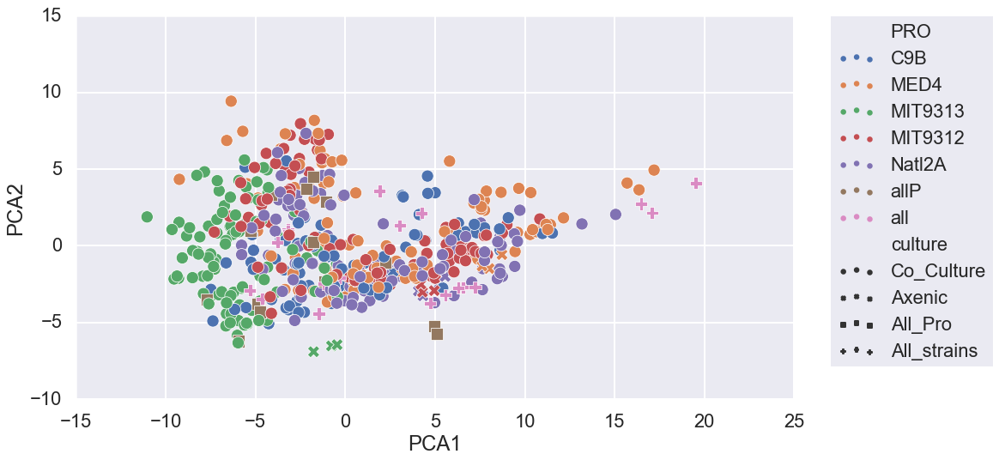

In [282]:
sns.scatterplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=200)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

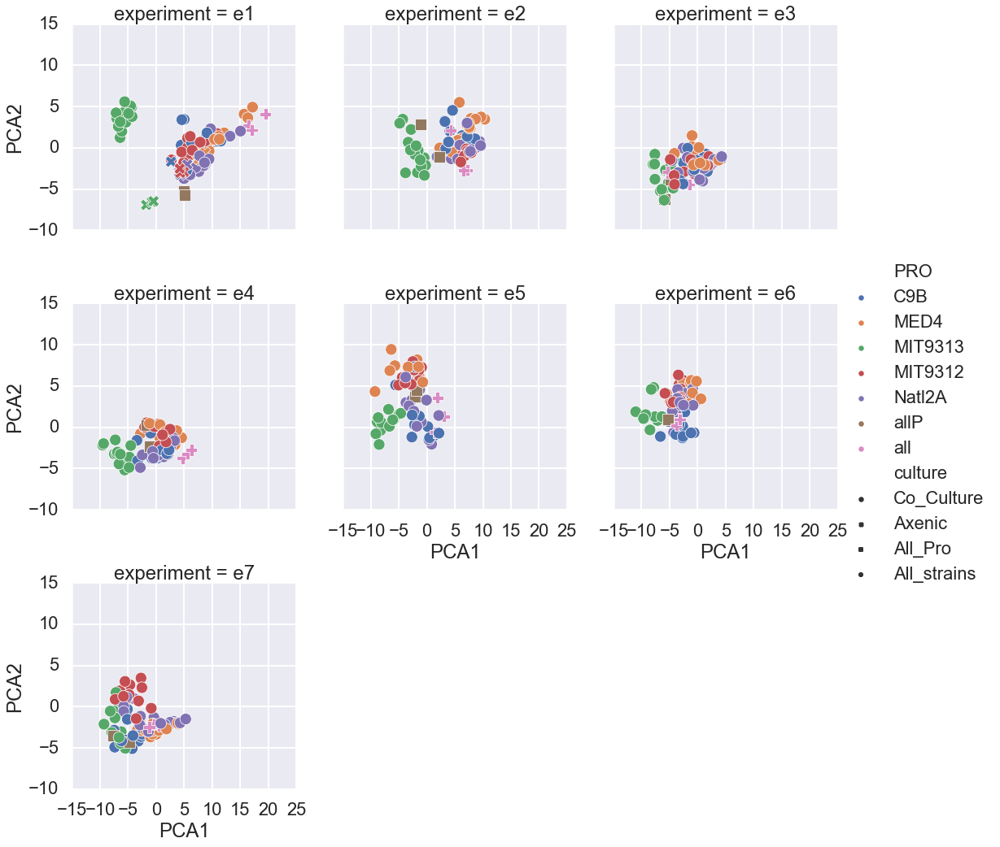

In [283]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=200, 
            col='experiment', col_wrap=3)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [284]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
X = g[feature_cols]
X.fillna(value=0, inplace=True)
scaledX = StandardScaler().fit_transform(X)
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(scaledX)
print('Variance percent explained\n', pca.explained_variance_ratio_)
dfpca = pd.DataFrame(data = principalComponents
             , columns = ['PCA1', 'PCA2', 'PCA3'])
for c in meta_cols:
    dfpca[c] = g[c]
dfpca['cat'] = dfpca.PRO + ', ' + dfpca.experiment

Variance percent explained
 [0.43710945 0.13341592 0.08961728]


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


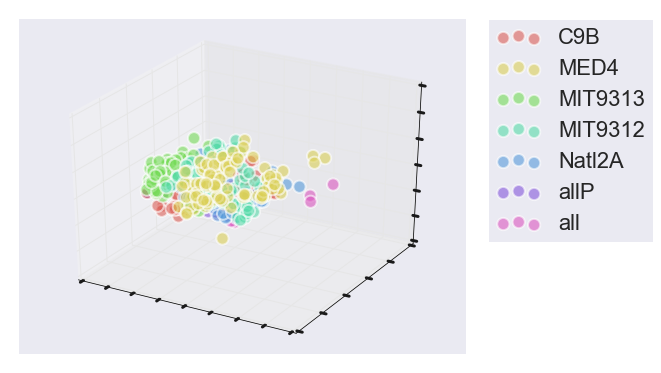

In [285]:
from matplotlib.colors import ListedColormap
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
numcolors = dfpca.PRO.nunique() 
numshapes = dfpca.culture.nunique() 
pallete = sns.color_palette('hls', n_colors=numcolors).as_hex() 
#cmap = ListedColormap(sns.color_palette(n_colors=numcolors))
for i, pro in enumerate(dfpca.PRO.unique()):
    #for culture in dfpca.culture.unique():
        d = dfpca.loc[(dfpca.PRO == pro)]
        ax.scatter(d.PCA1, d.PCA2, d.PCA3, s=150, alpha=0.6, edgecolors='w', c=pallete[i], label=pro)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_zticklabels([])

plt.show()

In [286]:
from sklearn.ensemble import RandomForestClassifier
X = g[feature_cols]
X.fillna(value=0, inplace=True)
scaledX = StandardScaler().fit_transform(X)
y = g['PRO']
clf = RandomForestClassifier(n_estimators=100, max_depth=2,
                              random_state=0)
clf.fit(scaledX, y)
print(clf.score(scaledX, y))

0.5420560747663551


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


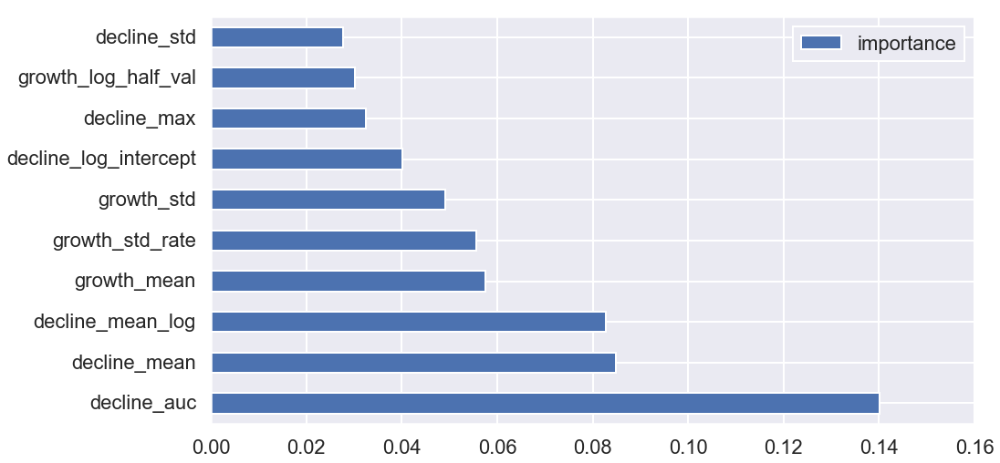

In [287]:
feature_importances = pd.DataFrame(clf.feature_importances_,
                                   index = X.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)
feature_importances.nlargest(columns='importance',n=10).plot(kind='barh')

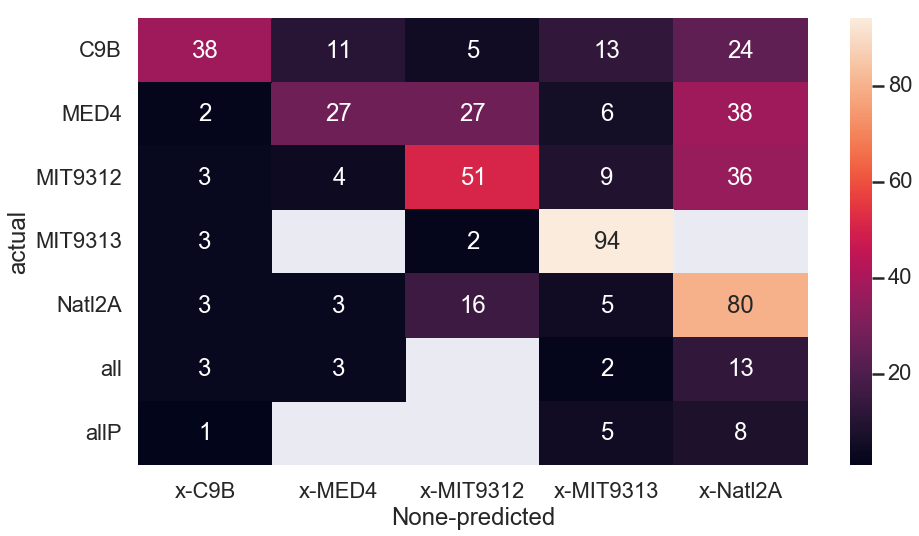

In [288]:
d = pd.DataFrame()
d['actual'] = y
d['predicted'] = clf.predict(scaledX)
d['x'] =1
t =d.pivot_table(index=['actual'],columns=['predicted'], aggfunc='count')
sns.heatmap(t,annot=True)

In [289]:
from sklearn.ensemble import RandomForestClassifier
X = g[feature_cols]
X.fillna(value=0, inplace=True)
scaledX = StandardScaler().fit_transform(X)
y = g['experiment'] + ', ' + g['PRO']
clf = RandomForestClassifier(n_estimators=100, max_depth=2,
                              random_state=0)
clf.fit(scaledX, y)
print(clf.score(scaledX, y))

0.4355140186915888


C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\frame.py:3790: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


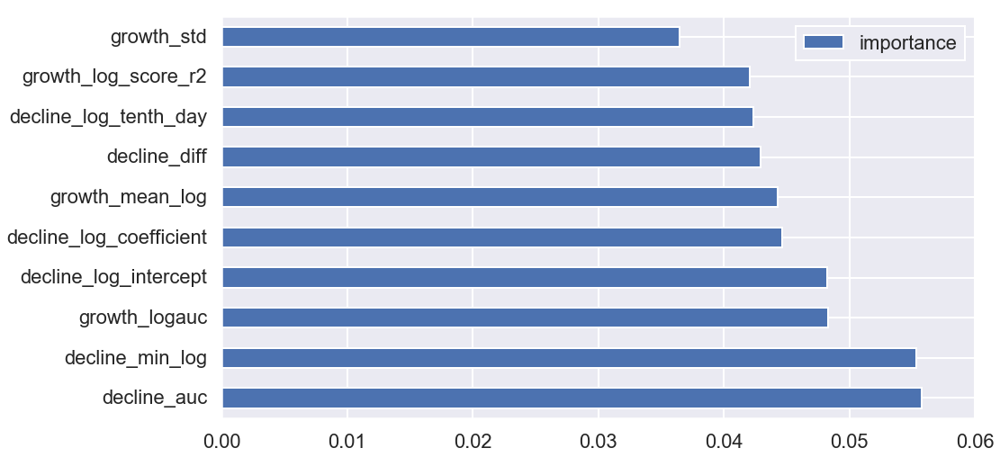

In [290]:
feature_importances = pd.DataFrame(clf.feature_importances_,
                                   index = X.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)
feature_importances.nlargest(columns='importance',n=10).plot(kind='barh')

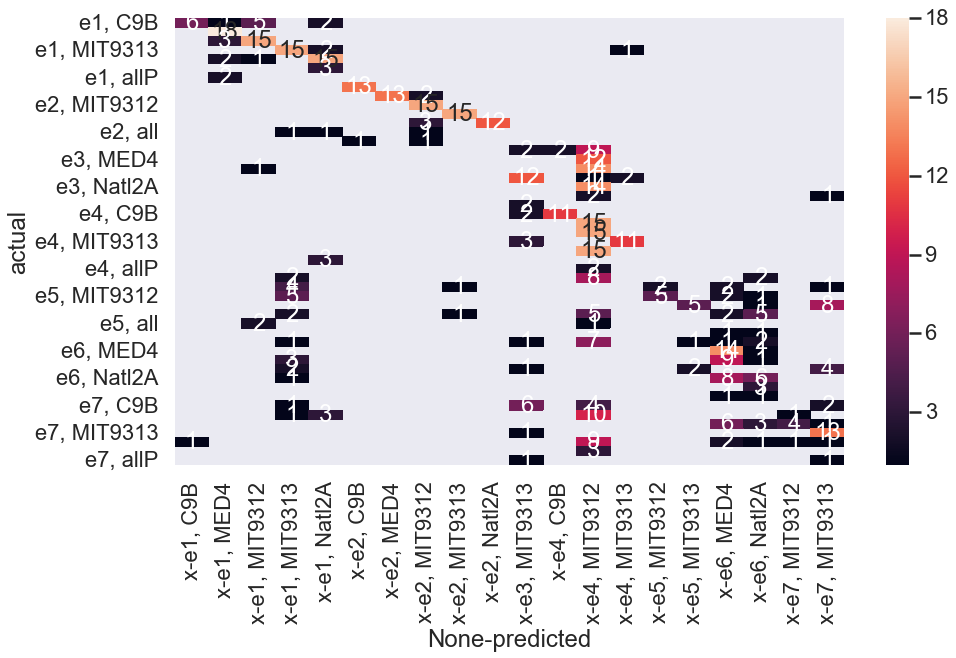

In [291]:
d = pd.DataFrame()
d['actual'] = y
d['predicted'] = clf.predict(scaledX)
d['x'] =1
t =d.pivot_table(index=['actual'],columns=['predicted'], aggfunc='count')
sns.heatmap(t,annot=True)

In [292]:
g2 = g.loc[(g.experiment == 'e1') | 
               (g.experiment == 'e3') |
               (g.experiment == 'e4') |
               (g.experiment == 'e5') |
               (g.experiment == 'e6') 
              ]

In [293]:
from sklearn.ensemble import RandomForestClassifier
X = g2[feature_cols]

scaledX = StandardScaler().fit_transform(X)
y = g2['PRO'] 
clf = RandomForestClassifier(n_estimators=100, max_depth=2,
                              random_state=0)
clf.fit(scaledX, y)
print(clf.score(scaledX, y))
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(clf.predict(scaledX), y))

0.6062992125984252
Accuracy: 0.6062992125984252


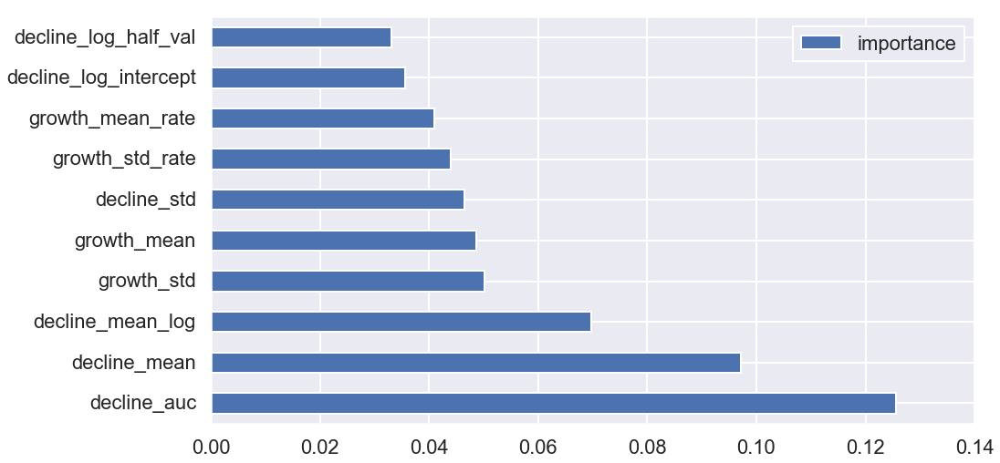

In [294]:
feature_importances = pd.DataFrame(clf.feature_importances_,
                                   index = X.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)
feature_importances.nlargest(columns='importance',n=10).plot(kind='barh')

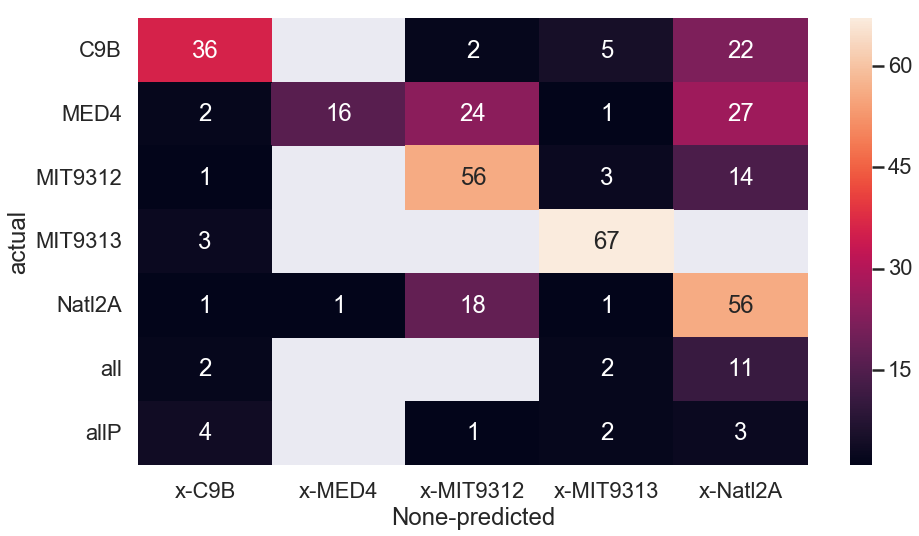

In [295]:
d = pd.DataFrame()
d['actual'] = y
d['predicted'] = clf.predict(scaledX)
d['x'] =1
t =d.pivot_table(index=['actual'],columns=['predicted'], aggfunc='count')
sns.heatmap(t,annot=True)

In [296]:
from sklearn.ensemble import RandomForestClassifier
X = g2[feature_cols]

scaledX = StandardScaler().fit_transform(X)
y = g2['PRO'] + ', ' + g2['culture']
clf = RandomForestClassifier(n_estimators=100, max_depth=2,
                              random_state=0)
clf.fit(scaledX, y)
print(clf.score(scaledX, y))
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(clf.predict(scaledX), y))

0.5721784776902887
Accuracy: 0.5721784776902887


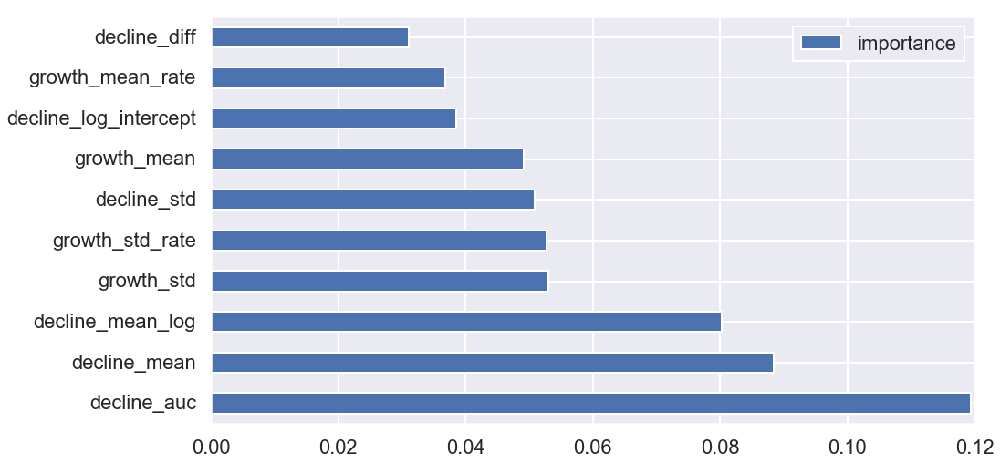

In [297]:
feature_importances = pd.DataFrame(clf.feature_importances_,
                                   index = X.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)
feature_importances.nlargest(columns='importance',n=10).plot(kind='barh')

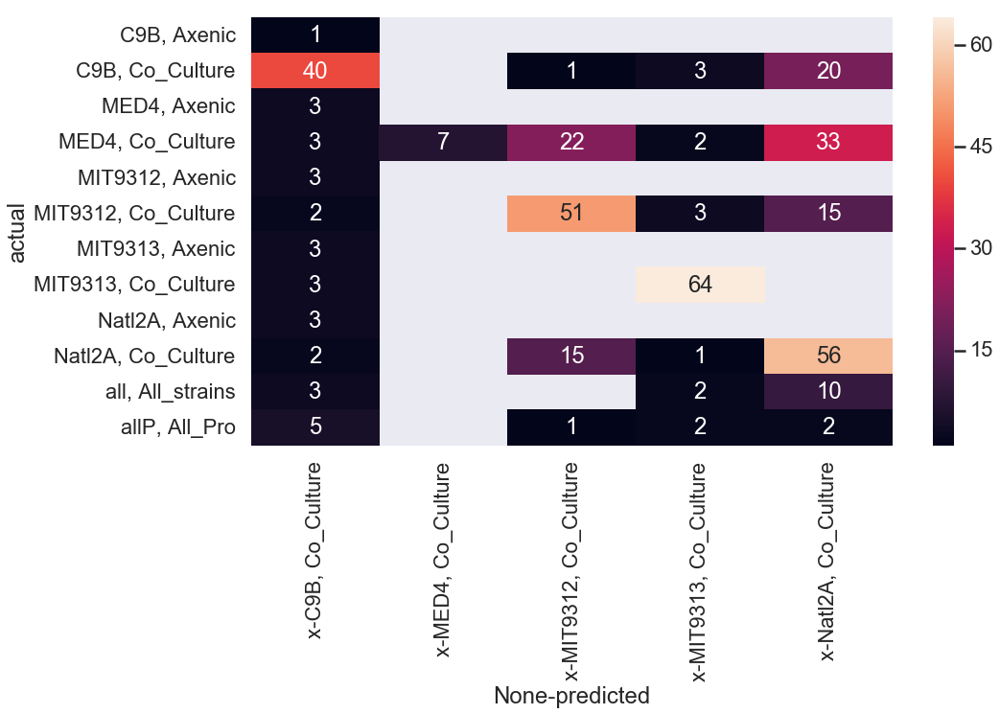

In [298]:
d = pd.DataFrame()
d['actual'] = y
d['predicted'] = clf.predict(scaledX)
d['x'] =1
t =d.pivot_table(index=['actual'],columns=['predicted'], aggfunc='count')
sns.heatmap(t,annot=True)

In [299]:
from sklearn.ensemble import RandomForestClassifier
X = g2[feature_cols]

scaledX = StandardScaler().fit_transform(X)
y = g2['ALT'] 
clf = RandomForestClassifier(n_estimators=100, max_depth=2,
                              random_state=0)
clf.fit(scaledX, y)
print(clf.score(scaledX, y))
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(clf.predict(scaledX), y))

0.49606299212598426
Accuracy: 0.49606299212598426


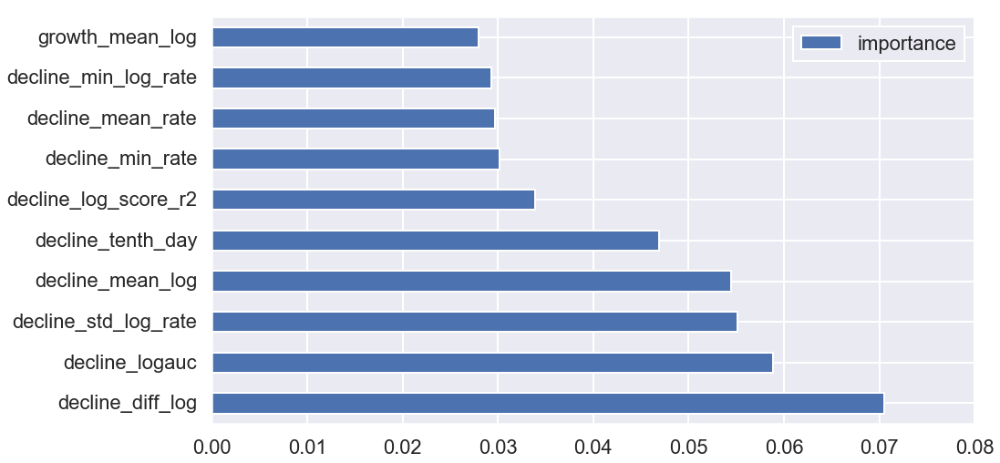

In [300]:
feature_importances = pd.DataFrame(clf.feature_importances_,
                                   index = X.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)
feature_importances.nlargest(columns='importance',n=10).plot(kind='barh')

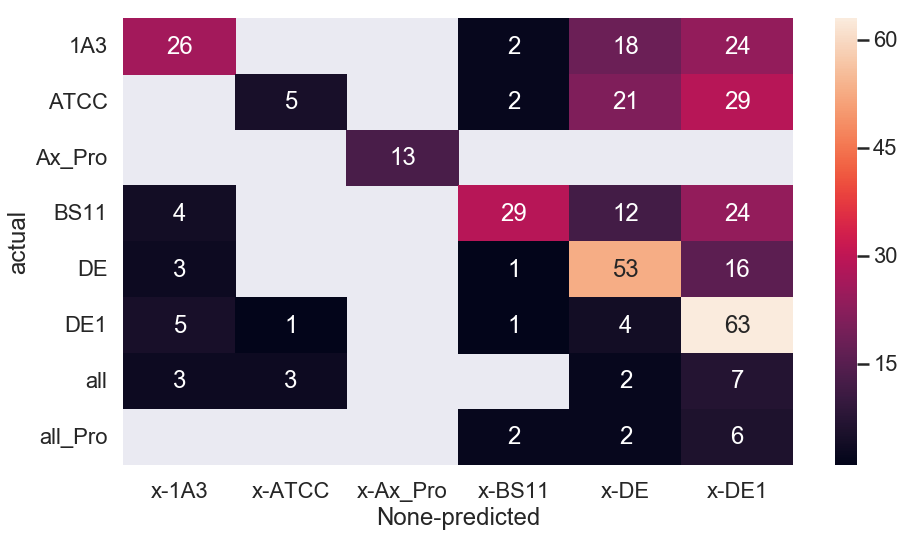

In [301]:
d = pd.DataFrame()
d['actual'] = y
d['predicted'] = clf.predict(scaledX)
d['x'] =1
t =d.pivot_table(index=['actual'],columns=['predicted'], aggfunc='count')
sns.heatmap(t,annot=True)

In [302]:
y.value_counts().count()

8

In [303]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
X = g2[feature_cols]
scaledX = StandardScaler().fit_transform(X)
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(scaledX)
print('Variance percent explained\n', pca.explained_variance_ratio_)
dfpca = pd.DataFrame(data = principalComponents
             , columns = ['PCA1', 'PCA2'])
for c in meta_cols:
    dfpca[c] = g2[c]
dfpca['cat'] = dfpca.PRO + ', ' + dfpca.experiment

Variance percent explained
 [0.44968403 0.15498803]


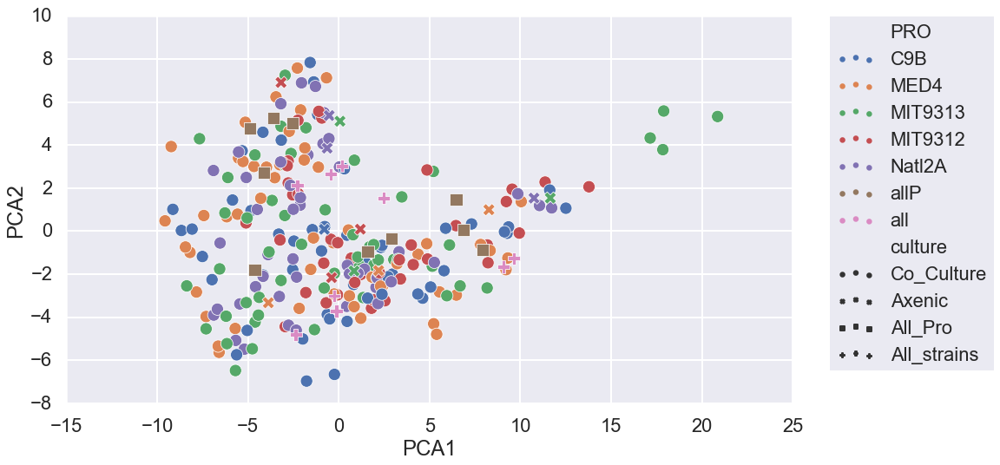

In [304]:
sns.scatterplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=200)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Comparison of all Experiments

In [129]:
df.head()

,day,experiment,sample,FL,PRO,ALT,culture,day_b,logFL,cumsumFL,zscoreFL,diffFL,diffday,rateFL,difflogFL,ratelogFL
0,0.000000,e1,1A,0.133,MED4,1A3,Co_Culture,0,-2.017406,0.133,-0.588733,NaN,NaN,NaN,NaN,NaN
1,0.715972,e1,1A,0.159,MED4,1A3,Co_Culture,1,-1.838851,0.292,-0.575763,0.026,0.715972,0.036314,0.178555,0.249388
2,1.925694,e1,1A,0.155,MED4,1A3,Co_Culture,2,-1.864330,0.447,-0.577758,-0.004,1.209722,-0.003307,-0.025479,-0.021062
3,2.831250,e1,1A,0.180,MED4,1A3,Co_Culture,3,-1.714798,0.627,-0.565287,0.025,0.905556,0.027607,0.149532,0.165127
4,6.674306,e1,1A,0.632,MED4,1A3,Co_Culture,7,-0.458866,1.259,-0.339798,0.452,3.843056,0.117615,1.255933,0.326806


In [193]:
df['experiment_sample'] = df.experiment + ', ' + df['sample']

In [194]:
dfd.head()

,experiment,sample,PRO,ALT,culture,day,logFL,experiment_sample
0,e1,10A,C9B,DE,Co_Culture,0.000000,-2.813411,"e1, 10A"
1,e1,10A,C9B,DE,Co_Culture,0.715972,-2.343407,"e1, 10A"
2,e1,10A,C9B,DE,Co_Culture,1.925694,-1.917323,"e1, 10A"
3,e1,10A,C9B,DE,Co_Culture,2.831250,-1.742969,"e1, 10A"
4,e1,10A,C9B,DE,Co_Culture,6.674306,-0.811931,"e1, 10A"


In [195]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
X = df.pivot(index='experiment_sample', columns='day', values='logFL')
# X.fillna(method='pad', inplace=True)
# scaledX = StandardScaler().fit_transform(X)
# pca = PCA(n_components=2)
# principalComponents = pca.fit_transform(scaledX)
# print('Variance percent explained\n', pca.explained_variance_ratio_)
# principalDf = pd.DataFrame(data = principalComponents
#              , columns = ['PCA1', 'PCA2'])
# principalDf.set_index(X.index, inplace=True)
# meta = meta_dfs[0]
# dfpca = pd.merge(left=principalDf, left_index=True, right=meta, right_on='sample')


In [196]:
Xi = X.interpolate(method='from_derivatives', axis=1,limit_area='inside')
Xi.fillna(method='pad', inplace=True, axis=1)

In [197]:
n = Xi.isna().sum()
n[n>0]

Series([], dtype: int64)

In [198]:
Xc = Xi.transform(pd.Series.cumsum, axis=1)


In [207]:

meta = df.groupby(['experiment_sample','experiment', 'sample', 'PRO', 'ALT', 'culture']).FL.mean().reset_index()
meta

,experiment_sample,experiment,sample,PRO,ALT,culture,FL
0,"e1, 10A",e1,10A,C9B,DE,Co_Culture,0.744932
1,"e1, 10B",e1,10B,C9B,DE,Co_Culture,0.801284
2,"e1, 10C",e1,10C,C9B,DE,Co_Culture,0.736932
3,"e1, 11A",e1,11A,MED4,DE1,Co_Culture,0.888386
4,"e1, 11B",e1,11B,MED4,DE1,Co_Culture,0.824352
5,"e1, 11C",e1,11C,MED4,DE1,Co_Culture,0.897716
6,"e1, 12A",e1,12A,MIT9313,DE1,Co_Culture,0.207102
7,"e1, 12B",e1,12B,MIT9313,DE1,Co_Culture,0.200795
8,"e1, 12C",e1,12C,MIT9313,DE1,Co_Culture,0.217341
9,"e1, 13A",e1,13A,MIT9312,DE1,Co_Culture,1.058636


In [208]:
scaledX = StandardScaler().fit_transform(Xc)
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(scaledX)
print('Variance percent explained\n', pca.explained_variance_ratio_)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['PCA1', 'PCA2'])
principalDf.set_index(X.index, inplace=True)

dfpca = pd.merge(left=principalDf, left_index=True, right=meta, right_on='experiment_sample')


Variance percent explained
 [0.86851513 0.08358386]


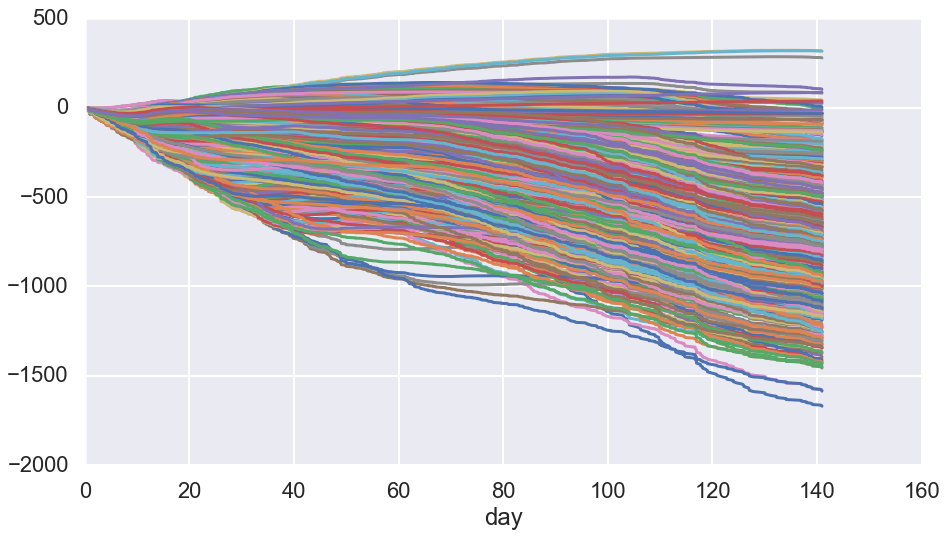

In [190]:
Xc.T.plot(legend=False)

C:\Users\wosnat\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


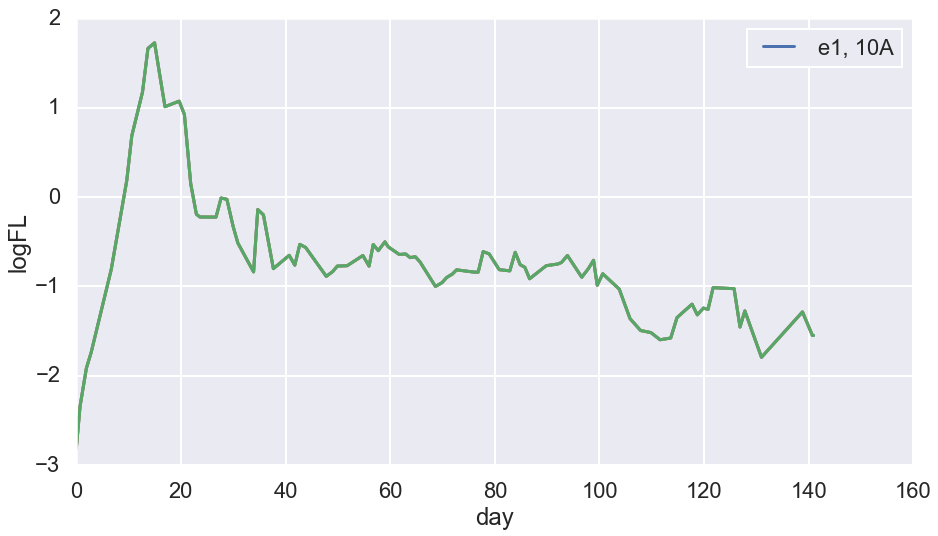

In [188]:
plt.plot(Xi.T['e1, 10A'])
d= df.loc[(df.experiment == 'e1') & (df['sample']=='10A')]
d['cumsumlogFL'] = d.logFL.transform(pd.Series.cumsum)
sns.lineplot(data=d,x='day', y='logFL')
plt.plot(Xi.T['e1, 10A'])


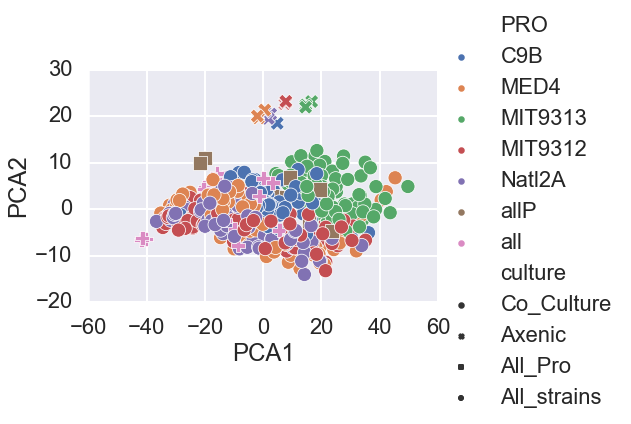

In [229]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=200,
             aspect=1.4)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

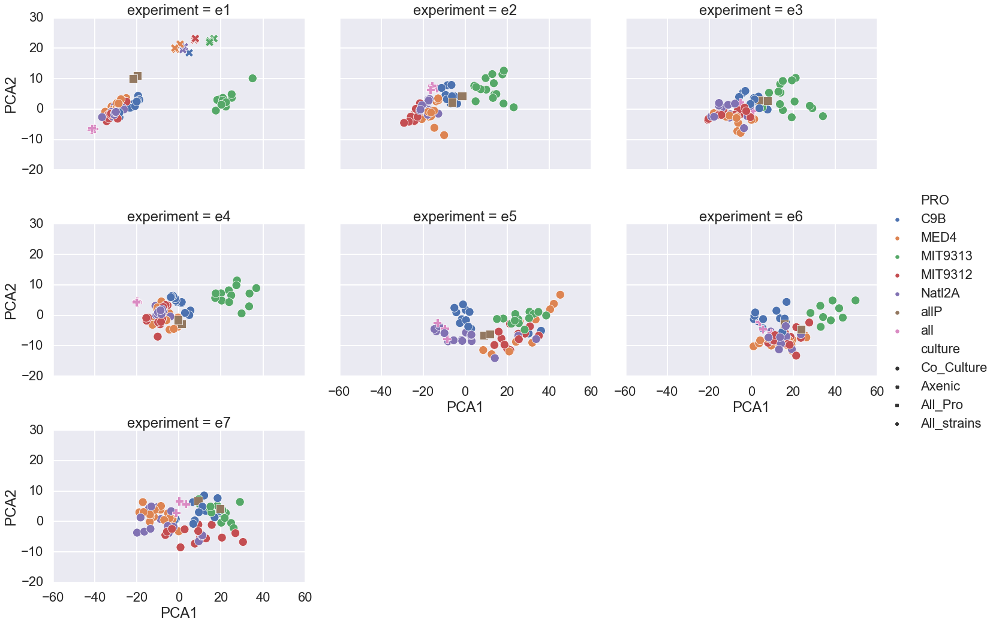

In [218]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='PRO', style='culture',s=200, 
            col='experiment', aspect=1.4, col_wrap=3)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

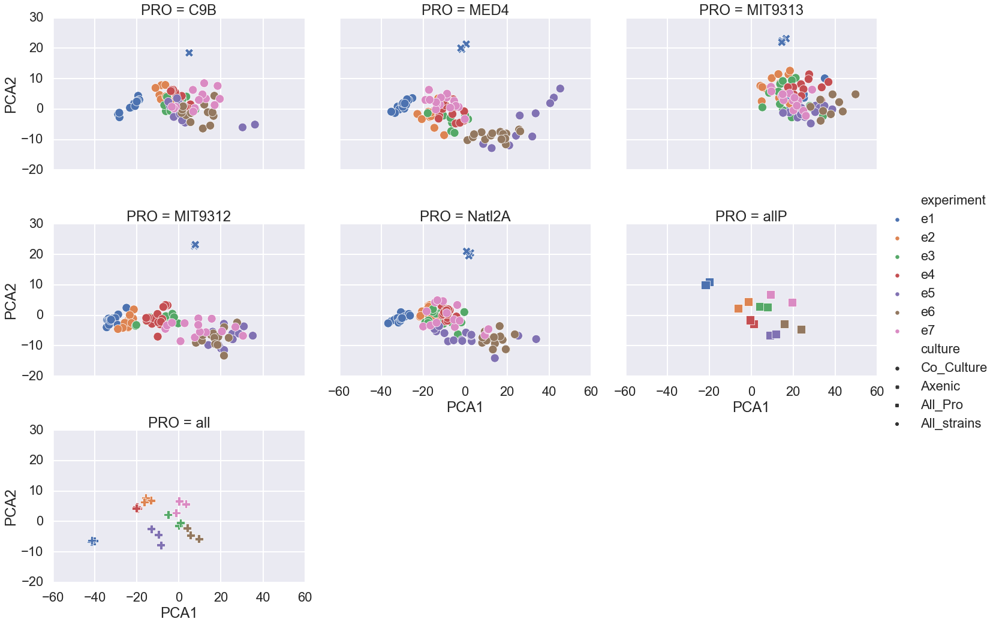

In [236]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', style='culture',s=200, 
            col='PRO', aspect=1.4, col_wrap=3)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

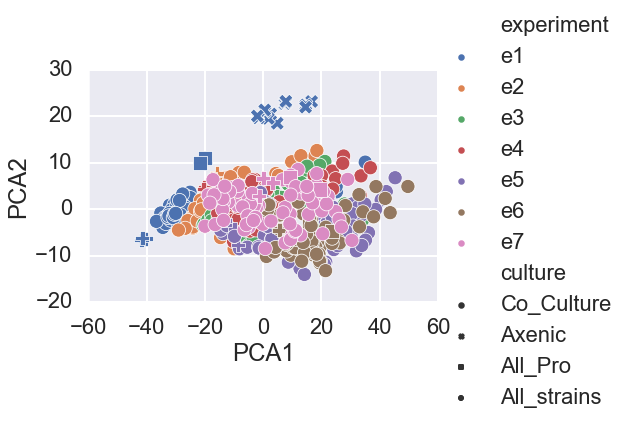

In [239]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='experiment', style='culture',s=200,  aspect=1.4,
           # col='PRO', aspect=1.4, col_wrap=3
           )
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

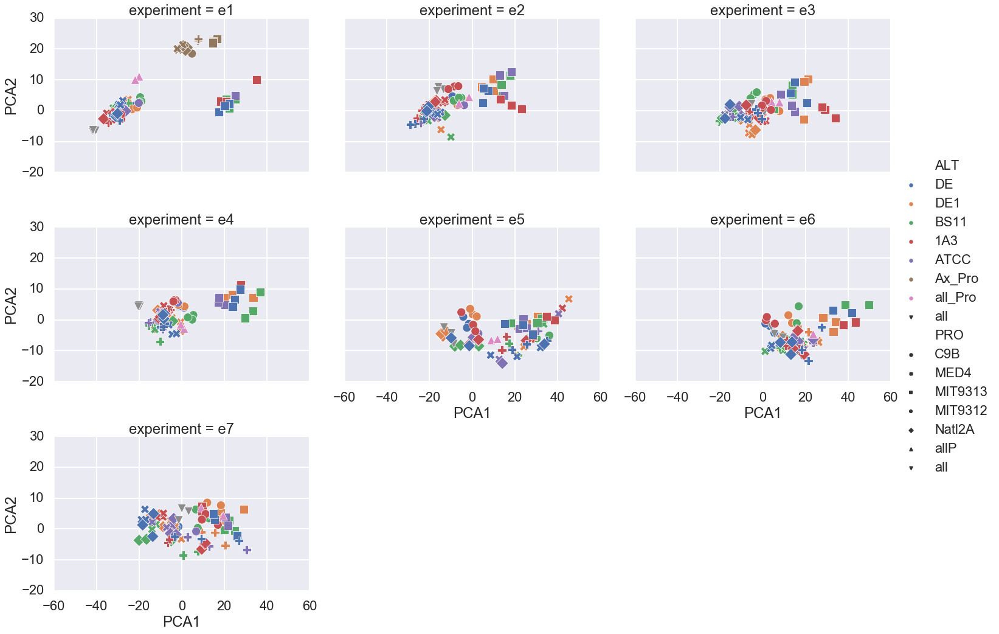

In [221]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='ALT', style='PRO',s=200, 
            col='experiment', aspect=1.4, col_wrap=3)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [230]:
from sklearn.ensemble import RandomForestClassifier
#scaledX = StandardScaler().fit_transform(Xc)
y = meta['PRO']
clf = RandomForestClassifier(n_estimators=100, max_depth=2,
                              random_state=0)
clf.fit(scaledX, y)
print(clf.score(scaledX, y))

0.4392523364485981


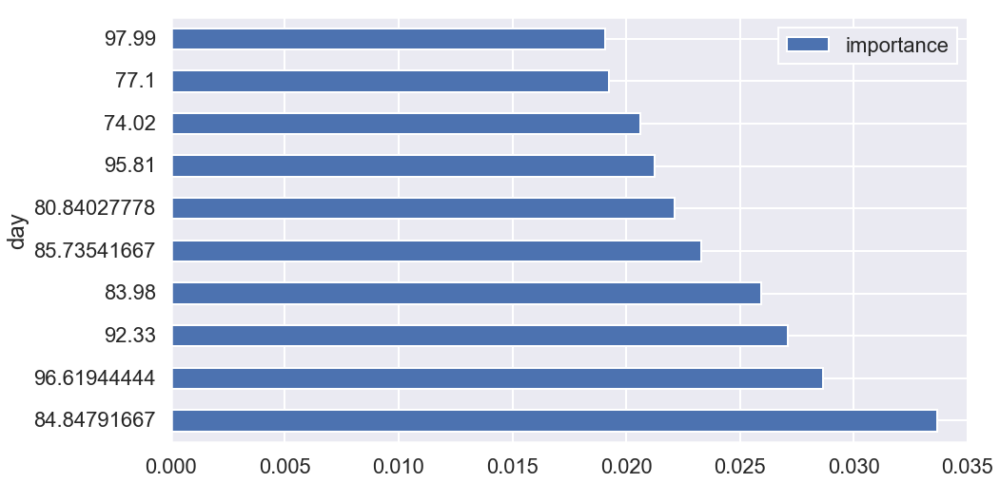

In [231]:
feature_importances = pd.DataFrame(clf.feature_importances_,
                                   index = X.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)
feature_importances.nlargest(columns='importance',n=10).plot(kind='barh')

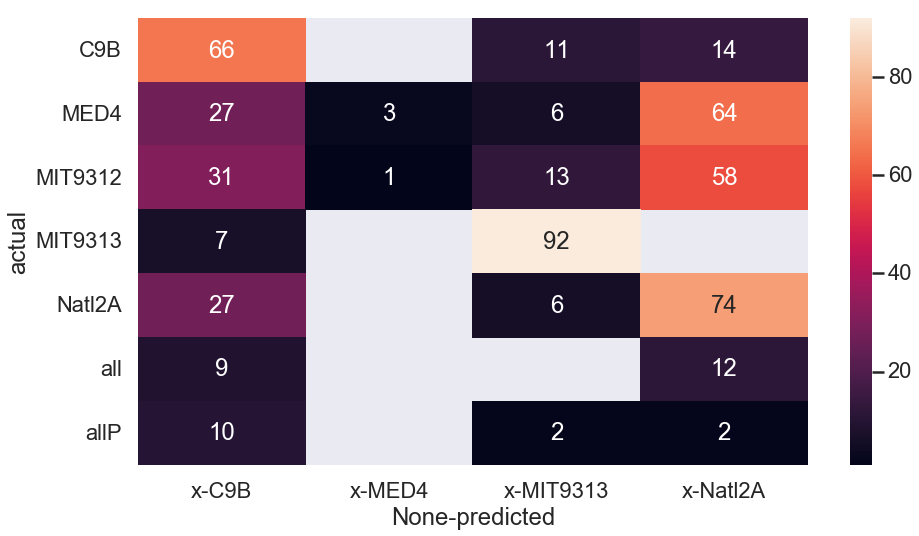

In [232]:
d = pd.DataFrame()
d['actual'] = y
d['predicted'] = clf.predict(scaledX)
d['x'] =1
t =d.pivot_table(index=['actual'],columns=['predicted'], aggfunc='count')
sns.heatmap(t,annot=True)

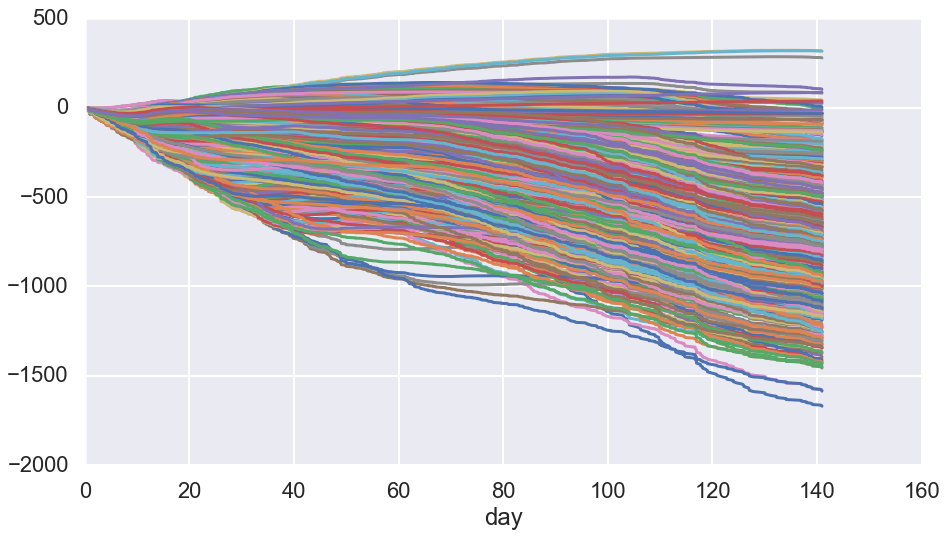

In [235]:
Xc.T.plot(legend=False)